In [1]:
!pip install pmdarima

In [2]:
import numpy as np
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import *
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import cross_val_score,GridSearchCV, train_test_split, KFold

from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXParams

import warnings
warnings.filterwarnings('ignore')

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Helper Functions

In [4]:
# Function 1

# Function to calculate err and all types of error
def reg_err_cal(actual, predict):
  err_df = pd.DataFrame(columns = ['Actual', 'Predict'], data = zip(actual, predict))
  err_df['Err%'] = (((err_df['Predict'] - err_df['Actual'])*100)/err_df['Actual'])
  err_df.sort_values(by = 'Err%', ascending = True, inplace = True)
  err_df.reset_index(inplace = True)
  max_err_percent = err_df['Err%'].max().round(2)
  min_err_percent = err_df['Err%'].min().round(2)
  mean_err_percent = err_df['Err%'].mean().round(2)
  med_err_percent = err_df['Err%'].median().round(2)
  return max_err_percent, min_err_percent, mean_err_percent, med_err_percent, err_df

In [5]:
# Function 2

# Function to calculate all types of metrics train and test data
def metrics_cal (test_actual, test_predict, train_actual, train_predict):
  r2 = (r2_score(test_actual, test_predict)).round(5)
  adj_r2_sc = (1 - (1 - r2 )*(len(train_actual)+len(test_actual))/((len(train_actual)+len(test_actual))-4-1)).round(5)
  rmse_train_sc = (np.sqrt(mean_squared_error(train_actual, train_predict))).round(2)
  rmse_test_sc = (np.sqrt(mean_squared_error(test_actual, test_predict))).round(2)
  mape_train_sc = (mean_absolute_percentage_error(train_actual,train_predict)).round(4)
  mape_test_sc = (mean_absolute_percentage_error(test_actual, test_predict)).round(4)
  return r2, adj_r2_sc, rmse_train_sc, rmse_test_sc, mape_train_sc, mape_test_sc

In [6]:
# Function 3

def get_particular_values(df, df_feature, feature_value):
  return df[df[df_feature] == feature_value]

In [7]:
# Function 4

# Plot of Best Fit Line of all stores with their various models
def plotiing_best_line(data, nrows = 5, ncols = 3, figsize = (25,26), hspace = 0.55, wspace = 0.2):
  nrows = len(list(data['Store'].unique()))
  ncols = 3
  fig , axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
  plt.suptitle('Best Fit Line', fontsize = 18)
  plt.subplots_adjust(hspace = hspace, wspace = wspace, top = 0.95)
  for i, store_no, model_name in zip(data.index.tolist(), data['Store'], data['model']):
    plt.subplot(nrows, ncols, i+1 )
    plt.scatter(data['test_Actual'][i].flatten(), data['test_Predict'][i].flatten(), c='crimson', label = 'DataPoints')
    p1 = max(max(data['test_Predict'][i].flatten()), max(data['test_Actual'][i].flatten()))
    p2 = min(min(data['test_Predict'][i].flatten()), min(data['test_Actual'][i].flatten()))
    plt.plot([p1, p2], [p1, p2], '-g', label = 'Best Line')
    plt.grid(True)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(f"Store:{store_no} Regression:{model_name}", fontsize = 13)
    plt.legend(loc = 'best')

In [8]:
# Function 5

# Function to plot actual values and predicted values
def models_projection(date_value, actual, predict, data):
  nrows = len(list(data['Store'].unique()))
  ncols = 3
  fig, axes = plt.subplots(nrows = nrows,ncols = ncols, figsize=(25, 26))
  plt.subplots_adjust(hspace = 0.8, wspace = 0.2)
  for i , model_name, store, in zip(data.index.tolist(), data['model'], data['Store']):
    plt.subplot(nrows,ncols , i+1)
    sns.lineplot(x = date_value[i], y = actual[i].flatten(), color = 'black', label = 'Actual')
    sns.lineplot(x = date_value[i], y = predict[i].flatten(), color = 'orange',label = 'Predicted')
    plt.grid(True)
    plt.title(f"Regression: {model_name} of Store:{store}", fontsize = 13)
    plt.ylabel('Predicted and Actual Value', fontsize = 12)
    plt.xticks(rotation = 45)

In [9]:
# Function 6

# Plots of Weekly Sales every Stores or Selected Stores
def plot_sales(store_list):
  nrows = len(store_list)//3
  ncols = 3
  fig, axes = plt.subplots(nrows = nrows,ncols = ncols, figsize=(20, 21))
  plt.subplots_adjust(hspace = 0.3, wspace = 0.2)
  for j, i in enumerate(store_list):
    dummy_store_df = get_store_df(df_rem , i)
    plt.subplot(nrows,ncols , j+1)
    sns.lineplot(x = dummy_store_df.index, y = dummy_store_df['Weekly_Sales'], color = 'green', label = 'Weekly Sales')
    plt.grid(True)
    plt.title(f"Top 9 Weekly Sales of Store:{i}", fontsize = 13)
    plt.ylabel('Weekly Sales', fontsize = 12)
    plt.xticks(rotation = 45)

In [10]:
# Function 7

def graph_plot(df, figsze =(15,10), row = 3, col = 2, space = 0.7):
  fg, axs = plt.subplots(row, col, figsize = figsze)
  plt.subplots_adjust(hspace = space)

  col_lis = list(df.columns)
  for i, val in enumerate(col_lis):
    if df[val].dtype == 'float64' or df[val].dtype == 'int64':
      if i < len(col_lis)-1:
        plt.subplot(row, col, i+1)
        sns.boxplot(x = df[val])
        plt.title(val )
        plt.xlabel(val)
        plt.xticks(rotation=45)




In [11]:
# Function 8

# Plot the graphs Of Fuel Price, CPI, Unemployment, and Temperature
# On Weekly Sales of each stores


def plot_features_effect(stor_lis):
  plt.subplots_adjust(wspace = 0.2)


  for i in stor_lis:
    fig, axs = plt.subplots(2,2, figsize=(25, 10))
    plt.subplots_adjust(hspace = 0.5)

    stor_df = get_store_df(df2, 'Store', i)

    plt.subplot(2,2,1)
    sns.lineplot(data = stor_df, y= 'Weekly_Sales', x= 'Fuel_Price', color = 'red' )
    plt.xlabel('Fuel Price', fontsize = 15)
    plt.ylabel('Weekly Sales', fontsize = 15)
    plt.title(f'Store {i}:-  Weekly Sales Of Fuel Price ', fontsize = 25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    plt.subplot(2,2,2)
    sns.lineplot(data = stor_df,x = 'CPI', y= 'Weekly_Sales', color = 'blue')
    plt.xlabel('CPI', fontsize = 25)
    plt.ylabel('Weekly Sales', fontsize = 25)
    plt.title(f'store {i}:- Effect on Weekly Sales due to CPI', fontsize = 35)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    plt.subplot(2,2,3)
    sns.lineplot(data = stor_df, x = 'Unemployment', y = 'Weekly_Sales', color = 'orange')
    plt.xlabel('Unemployment', fontsize = 25)
    plt.ylabel('weekly Sales', fontsize = 25)
    plt.title(f'Store {i}:- Effect on Weekly Sales due to Unemployment', fontsize = 35)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    plt.subplot(2,2,4)
    sns.lineplot(data = stor_df, x = 'Temperature', y = 'Weekly_Sales', color = 'green')
    plt.xlabel('Temperature', fontsize = 25)
    plt.ylabel('Weekly Sales', fontsize = 25)
    plt.title(f'Store {i}:- Effect on weekly Sales due to Temperature', fontsize = 35)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.show()



In [12]:
# Function 9

# Function to knowfor bad entries
#   Input is data frame and list of bad entries
#   Entries to be noted on
#   Returns the Dateframe found of bad entries

def get_bad_entry (df, bad_data = ['#', "@", "?"]):
  bad_df = pd.DataFrame(columns = ['col_name', 'bad_entries', 'Total_entries']).dropna()

  col_lis = list(df.columns)

  bad_ent, bad_col, bad_tot = [], [], []

  for i in bad_data:
    for j, col in enumerate(col_lis):
      a = df[(df[col] == i)].shape[0]
      if a > 0:
        bad_ent.append(i)
        bad_col.append(col)
        bad_tot.append(a)

  bad_df['bad_entries'] = bad_ent
  bad_df['col_name'] = bad_col
  bad_df['Total_entries'] = bad_tot

  if bad_df.shape[0] > 0:
    print('Bad Entries Found:')
    return bad_df
  else:
    return "No Bad Entries Found"



In [13]:
# Function 10

# get stores features and values according the stores no

def get_store_df(df,i, col = 'Store',):
  dbf = pd.DataFrame()
  dbf = df[df[col] == i]
  return dbf

In [14]:
# Function 11

# correlation of all stores with all features and single feature

def corrl_store_single(data, col = 'all'):
  if col != 'all':
    sorted_df = data.sort_values(by = col, ascending = True)
    plt.figure(figsize = (15,3))
    sns.barplot(data = sorted_df, x = sorted_df.index, y = sorted_df[col],order = sorted_df.index )
    plt.xlabel('Stores')
    plt.ylabel('Correlation')
    plt.title(f'correlation of {col} with weekly sales ', fontsize = 10)
    plt.xticks(rotation = 45, fontsize = 10)
  else:
    plt.subplots(5,1, figsize = (15,12))
    plt.subplots_adjust(hspace = 0.9)
    for i , val in enumerate(data.columns):
      sorted_df = pd.DataFrame()
      sorted_df = data.sort_values(by = val, ascending = True)
      plt.subplot(5,1,i + 1)
      sns.barplot(data = sorted_df, x = sorted_df.index, y = sorted_df[val], order = sorted_df.index)
      plt.title(f'Correaltion of {val} with weekly sales ', fontsize = 10)
      plt.xlabel('Stores')
      plt.ylabel(f'Correlation', fontsize = 8)
      plt.xticks(rotation = 45, fontsize = 10)


In [15]:
# Function 12

# Negative correlation Stores

def neg_corr_store(data, df, col):
  dum_store_corr_T = store_corr_T.columns
  for i in dum_store_corr_T:
    if i == col:
      neg_corr = store_corr_T[store_corr_T[i] < 0].sort_values(by = i)
  neg_corr_df = pd.DataFrame()
  for i in neg_corr.index:
    neg_corr_df = neg_corr_df.append(df[df['Store'] == i], ignore_index = True)
  return neg_corr_df

# Positive correlation Stores
def pos_corr_store(data, df,col):
  dum_store_corr_T = store_corr_T.columns
  for i in dum_store_corr_T:
    if i == col:
      pos_corr = store_corr_T[store_corr_T[i] > 0].sort_values(by = i)
  pos_corr_df = pd.DataFrame()
  for i in pos_corr.index:
    pos_corr_df = pos_corr_df.append(df[df['Store'] == i], ignore_index = True)
  return pos_corr_df


In [16]:
# Function 13

# Correlation of all stores Weekly Sales with all features and Particular Feature

def corrl_stores_sep(data, col):
  if not isinstance(col, str) :
    print("Please pass the correct column values u want or use 'all' for all columns correlation")
  all_col_pos_corr, all_col_neg_corr = [], []
  dum_store_corr_T = store_corr_T.columns
  for i in dum_store_corr_T:
    if i == col:
      pos_corr = store_corr_T[store_corr_T[i] > 0].sort_values(by = i)
      neg_corr = store_corr_T[store_corr_T[i] < 0].sort_values(by = i)
      print(f"\n There are {pos_corr.shape[0]} stores whose Weekly Sales increase as {i} increases")
      # print(f"\n {pos_corr[i]}")
      print(f"\n There are {neg_corr.shape[0]} stores whose Weekly Sales decreases as {i} increases")
      # print(f"\n {neg_corr[i]}")
    elif col == "all":
      pos_corr = store_corr_T[store_corr_T[i] > 0].sort_values(by = i)
      neg_corr = store_corr_T[store_corr_T[i] < 0].sort_values(by = i)
      print(f"\n There are {pos_corr.shape[0]} stores whose Weekly Sales increases as {i} increases")
      print(f"\n There are {neg_corr.shape[0]} stores whose Weekly Sales decreases as {i} increases")
      all_col_pos_corr.append(pos_corr)
      all_col_neg_corr.append(neg_corr)



# visualization Correlation of all stores Weekly Sales with all features and Particular Feature with positve and Negative

def corrl_stores_sep_visual (store_corr_T, col):
  if not isinstance(col, str) :
    print("Please pass the correct column values u want or use 'all' for all columns correlation")
  all_col_pos_corr, all_col_neg_corr = [], []
  dum_store_corr_T = store_corr_T.columns
  for i in dum_store_corr_T:
    if i == col:
      pos_corr = store_corr_T[store_corr_T[i] > 0].sort_values(by = i)
      neg_corr = store_corr_T[store_corr_T[i] < 0].sort_values(by = i)
    elif col == "all":
      pos_corr = store_corr_T[store_corr_T[i] > 0].sort_values(by = i)
      neg_corr = store_corr_T[store_corr_T[i] < 0].sort_values(by = i)
      all_col_pos_corr.append(pos_corr)
      all_col_neg_corr.append(neg_corr)
  def corrl_plot ():
    def check_col(col):
      for i in dum_store_corr_T:
        if i == col:
          return True
      return False

    if check_col(col):
      fig = plt.subplots(1,2, figsize = (13,4))
      plt.subplots_adjust(wspace = 0.3)
      plt.subplot(1,2,1)
      sns.barplot(data = pos_corr, y = pos_corr[col], x= pos_corr.index)
      plt.title("Weekly Sales Positive Corr", fontsize = 10)
      plt.xlabel('Stores')
      plt.ylabel(col)
      plt.xticks(rotation = 45, fontsize = 8)

      plt.subplot(1,2,2)
      ax = sns.barplot(data = neg_corr, y = neg_corr[col], x= neg_corr.index)
      ax.invert_yaxis()
      plt.title("Weekly Sales Negative Corr", fontsize = 10)
      plt.xlabel('Stores')
      plt.ylabel(col)
      plt.xticks(rotation = 45, fontsize = 8)
    elif col == 'all':
      fig = plt.subplots(5,2, figsize = (20,15))
      plt.subplots_adjust(hspace = 0.5, wspace = 0.3)
      for i, val in enumerate(dum_store_corr_T):
        if i < len(all_col_pos_corr) :
          def odd(i):
            rt = [j for j in range(1,11,2)]
            return rt[i]

          plt.subplot(5,2,odd(i))
          sns.barplot(data = all_col_pos_corr[i], y = all_col_pos_corr[i][val], x = all_col_pos_corr[i].index)
          plt.title('Weekly Sales positive corr', fontsize = 10)
          plt.xlabel('Stores', fontsize = 12)
          plt.ylabel(val)
          plt.xticks(rotation = 45, fontsize = 9)

          def even(i):
            rt = [j for j in range(2,11, 2)]
            return rt[i]
          plt.subplot(5,2, even(i))
          ax = sns.barplot(data = all_col_neg_corr[i], y = all_col_neg_corr[i][val], x = all_col_neg_corr[i].index)
          ax.invert_yaxis()
          plt.title('Weekly Sales Negative corr', fontsize = 10)
          plt.xlabel('Stores', fontsize = 12)
          plt.ylabel(val)
          plt.xticks(rotation = 45, fontsize = 9)

  corrl_plot()




In [17]:
# Function 14

# plot graph correlation between independent features and Weekly_Sales

def graph_of_correlation(store_corr_T):
  fig , axs = plt.subplots(figsize= (15,5))
  sns.lineplot(x = store_corr_T.index, y = store_corr_T['Holiday_Flag'], color = 'orange', label = 'Holiday_Flag')
  sns.lineplot(x = store_corr_T.index, y = store_corr_T['Temperature'], color = 'black', label = 'Temperature')
  sns.lineplot(x = store_corr_T.index, y = store_corr_T['CPI'], color = 'red', label = 'CPI')
  sns.lineplot(x = store_corr_T.index, y = store_corr_T['Unemployment'], color = 'blue', label = 'Unemployment')
  sns.lineplot(x = store_corr_T.index, y = store_corr_T['Fuel_price'], color = 'green', label = 'Fuel_price')
  plt.legend(loc = 'best')
  plt.title('Correlation of Weekly_sales with independent Features')
  plt.ylabel('Corrleation')
  plt.xlabel('Stores')
  plt.xticks(rotation = 45)
  plt.grid(True)
  plt.show()




In [18]:
# Function 15

# Function for univariate analysis

def uni_analysis(data, i, bin = 15, height = 5, aspect = 1.6, fontsize = 10):
  sns.displot(data[i] ,bins = bin, kde = True, color = sns.color_palette('colorblind')[np.random.randint(0,5)], height = height, aspect = aspect)
  plt.xticks(rotation = 45, fontsize = fontsize)
  plt.show()

In [19]:
# Function 16

def uni_tot_analysis(data,bin = 15, fontsize = 10):
  fig , axs = plt.subplots(4,2, figsize = (12,6))
  plt.subplots_adjust(hspace = 1.3, wspace = 0.2)
  axs[3,1].axis('off')
  for i, val in enumerate(data.columns):
    plt.subplot(4,2,i+1)
    sns.distplot(data[val], bins = bin, kde = True, color = sns.color_palette('colorblind')[np.random.randint(0,5)])
    plt.title('Univariate Analysis',fontsize = 10)
    plt.xticks(rotation = 45, fontsize = fontsize)
    fig.show()

In [20]:
# Function 17

# Check Outliers using violin plot

def check_outliers(data):
  fig = plt.subplots(3,2, figsize = (15,10))
  plt.subplots_adjust(wspace = 0.15, hspace = 0.7)
  j = 0
  for i in data.columns:
    if data[i].dtype != 'object':
      plt.subplot(3,2, j + 1)
      sns.violinplot(x = data[i], color = sns.color_palette('colorblind')[np.random.randint(0,4)])
      plt.title(f'Boxplot Of {i}', fontsize = 10)
      plt.xlabel(i)
      plt.xticks(fontsize = 10)
      j += 1

In [21]:
# Function 18

# Removing Outliers

def outliers_removal(df, cols = ['Weekly_Sales']):
  for i in cols:
    q1 , q3 = df[i].quantile(0.25),df[i].quantile(0.75)
    IQR = q3 - q1
    lower_limit = q1 - 1.5*IQR
    upper_limit = q3 + 1.5*IQR
    df = df[(df[i] >= lower_limit) & (df[i] <= upper_limit)]
  return df

In [97]:
# Function 19

def forecast_Predict_projection(data, what = None):
  nrows = (len(list(data['Store'].unique())))//2
  ncols = 2
  fig, axes = plt.subplots(nrows = nrows,ncols = ncols, figsize=(20,10))
  plt.subplots_adjust(hspace = 1.1, wspace = 0.2)
  if what == 'AR_Predict':
    for i , store, in zip(data.index.tolist(), data['Store']):
      plt.subplot(nrows,ncols , i+1)
      sns.lineplot(x = data['Test_Date'][i], y = data['Test_value'][i], color = 'green', label = 'Test_Values')
      sns.lineplot(x = data['Arima_Date'][i], y = data['Arima_Predict'][i], color = 'orange', label = 'Predict_Values')
      plt.grid(True)
      plt.title(f"ARIMA: Prediction of Store:{store}", fontsize = 9)
      plt.ylabel('Prediction ', fontsize = 9)
      plt.xticks(rotation = 45,fontsize = 9)
      plt.legend(loc = 'best', fontsize = 7)
  elif what == 'AR_Forecast':
    for i , store, in zip(data.index.tolist(), data['Store']):
      plt.subplot(nrows,ncols , i+1)
      sns.lineplot(x = data['Forecasted_Date'][i], y = data['Forecasted_Weekly_Sales'][i], color = 'orange', label = 'ARI_ForeCast')
      plt.grid(True)
      plt.title(f"ARIMA: Forecast of Store:{store}", fontsize = 9)
      plt.ylabel('Forecast', fontsize = 9)
      plt.xticks(rotation = 45, fontsize = 9)
      plt.legend(loc = 'best', fontsize = 7)
  else:
      for i , store, in zip(data.index.tolist(), data['Store']):
        plt.subplot(nrows,ncols , i+1)
        sns.lineplot(x = data['Full_Arima_Predict_dates'][i], y = data['Full_Arima_Predict'][i], color = 'green', label = 'Predicted')
        sns.lineplot(x = data['Forecasted_Date'][i], y = data['Forecasted_Weekly_Sales'][i], color = 'red', linestyle = '--', label = 'ForeCast')
        sns.lineplot(x = data['Actual_Date'][i], y = data['Actual_value'][i], color = 'orange', label = 'Actual')
        plt.grid(True)
        plt.title(f"All Plots of Store:{store}", fontsize = 9)
        plt.ylabel('Forecast with Predict  ', fontsize = 9)
        plt.xticks(rotation = 45, fontsize = 9)
        plt.legend(loc = 'best', fontsize = 7)

In [98]:
# Function 20

def check_stationary (data, store_no):
  check_sales = pd.DataFrame(columns = ['Store','Data'])
  for i in store_no:
    ad_ful_store = get_store_df(data, i)
    ad_ful_store = ad_ful_store[['Weekly_Sales']]
    check = adfuller(ad_ful_store['Weekly_Sales'], autolag = 'AIC')
    if check[1] < 0.05:
      print(f'Reject Null Hypothesis :Weekly Sales data of Store {i} is stationary')
      check_sales = check_sales.append({'Store': i, 'Data': 'Stationary'}, ignore_index = True)
    else:
      print(f'Accept Null Hypothesis :Weekly Sales data of Store {i} is not stationary')
      check_sales = check_sales.append({'Store': i, 'Data': 'Non-Stationary'}, ignore_index = True)

In [100]:
# Function 21

# Best Possible combinations with best aic values
import itertools
def order_forecast (data):
  p = range(0, 4)  # AR terms
  d = range(0, 3)  # Differencing
  q = range(0, 4)  # MA terms
  # Generate all possible combinations of p, d, q
  pdq = list(itertools.product(p, d, q))
  best_aic = float("inf")
  best_order = None
  # Grid search over all combinations
  for order in pdq:
    try:
      model = ARIMA(data, order=order)
      results = model.fit()
      aic = results.aic
      if aic < best_aic:
        best_aic = aic
        best_order = order
    except:
        continue
  return best_order

In [27]:
# Function 22

def store_seasonal(data, store_no, par_val = 8, Train = False, Test = False ,plot = True):
  sep_store = pd.DataFrame(columns = ['Store','Original','Trend','Seasonality','Residual'])
  for i in store_no:
    forecast_store = get_store_df(data, i)
    forecast_store = forecast_store[['Weekly_Sales']]
    result = seasonal_decompose(forecast_store['Weekly_Sales'], model = 'additive', period = 52)
    if plot == True:
      plt.figure(figsize=(11, 8))
      plt.subplot(411)
      plt.plot(result.observed, label='Original')
      plt.title(f"Store: {i}")
      plt.legend(loc='best')
      plt.subplot(412)
      plt.plot(result.trend, label='Trend')
      plt.title(f"Store: {i}")
      plt.legend(loc='best')
      plt.subplot(413)
      plt.plot(result.seasonal, label='Seasonality')
      plt.title(f"Store: {i}")
      plt.legend(loc='best')
      plt.subplot(414)
      plt.plot(result.resid, label='Residuals')
      plt.title(f"Store: {i}")
      plt.legend(loc='best')
      plt.tight_layout()
      plt.show()
  if plot == False:
    return sep_store # train_sep_store, test_sep_store


In [109]:
# Function 23

def check_stationary_detrend (data, store_no):
  check_sales = pd.DataFrame(columns = ['Store','Data'])
  for i in store_no:
    ad_ful_store = get_store_df(data, i)
    ad_ful_store = ad_ful_store[['Weekly_Sales']]
    moving_average = ad_ful_store['Weekly_Sales'].rolling(window = 52, min_periods=1, center=True).mean()
    rolling_mean_detrended = ad_ful_store['Weekly_Sales'] - moving_average
    rolling_mean_detrended = rolling_mean_detrended.dropna()
    check = adfuller(rolling_mean_detrended, autolag = 'AIC')
    if check[1] < 0.05:
      print(f'Reject Null Hypothesis :Weekly Sales data of Store {i} is stationary')
      check_sales = check_sales.append({'Store': i, 'Data': 'Stationary'}, ignore_index = True)
    else:
      print(f'Accept Null Hypothesis :Weekly Sales data of Store {i} is not stationary')
      check_sales = check_sales.append({'Store': i, 'Data': 'Non-Stationary'}, ignore_index = True)

In [118]:
# Function 24

def compare_plot(reg_data, data):
  j = 1
  k = 2
  nrows = len(store_list)
  ncols = 2
  reg_data = reg_data[reg_data['model'] == 'GB']
  fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (25,30))
  plt.subplots_adjust(hspace = 1.1, wspace = 0.2)
  for i in reg_data.index.tolist():
    if j <= (nrows * ncols):
      plt.subplot(nrows,ncols, j)
      sns.lineplot(x = reg_data['total_date'][i], y = reg_data['total_Actual'][i].flatten(), color = 'black', label = 'Actual')
      sns.lineplot(x = reg_data['total_date'][i], y = reg_data['total_Predict'][i].flatten(), color = 'orange',label = 'Predicted')
      plt.title(f"Gradient Boost of Store: {reg_data['Store'][i]}")
      plt.xticks(rotation = 45)
      j += 2
  for l in data.index.tolist():
    if k <= (nrows*ncols):
      plt.subplot(nrows, ncols, k)
      sns.lineplot(x = data['Full_Arima_Predict_dates'][l], y = data['Full_Arima_Predict'][l], color = 'green', label = 'Predicted')
      sns.lineplot(x = data['Forecasted_Date'][l], y = data['Forecasted_Weekly_Sales'][l], color = 'red', linestyle = '--', label = 'ForeCast')
      sns.lineplot(x = data['Actual_Date'][l], y = data['Actual_value'][l], color = 'orange', label = 'Actual')
      plt.title(f"Forecast of Store: {data['Store'][l]}")
      plt.xticks(rotation = 45)
      k += 2

## Step 1: Data PreProcessing

 Load the Dataset

In [22]:
df = pd.read_csv('Walmart DataSet.csv')
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by = 'Date', ascending = True)
df.set_index(df['Date'], inplace= True)
df.drop('Date', axis = 1, inplace = True)

In [23]:
df_saved = df.copy()
df2 = df.copy()

In [24]:
df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-01-10,5,283178.12,0,71.10,2.603,212.226946,6.768
2010-01-10,15,566945.95,0,59.69,2.840,132.756800,8.067
2010-01-10,42,481523.93,0,86.01,3.001,126.234600,9.003
2010-01-10,33,224294.39,0,91.45,3.001,126.234600,9.265
2010-01-10,36,422169.47,0,74.66,2.567,210.440443,8.476


Clean the Dataset

In [28]:
# Function 9 used

# Check for bad entries in data

get_bad_entry(df)

'No Bad Entries Found'

In [29]:
# get info on the columns and dataset
# Info of the data as there are no null values present in any of the column (CPI, Fuel_Price, Temperature, Hoilday_Flag, Weekly_Sales, Store)
# And the total of entries in the present 7 features are of 6435. shape(6435, 7)
# There are no object type of data present in the present features

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-01-10 to 2012-12-10
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Weekly_Sales  6435 non-null   float64
 2   Holiday_Flag  6435 non-null   int64  
 3   Temperature   6435 non-null   float64
 4   Fuel_Price    6435 non-null   float64
 5   CPI           6435 non-null   float64
 6   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 402.2 KB


In [30]:
# Check null Values
df.isna().sum()

Store           0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [31]:
# Check Duplicate Values

df.duplicated().sum()

0

## Step 2: EDA

In [32]:
# list no of stores
store_list = sorted(list(df2['Store'].unique()))

In [33]:
# change store from int to object

df['Store'] = df['Store'].astype('str')

In [34]:
# check description of data

df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Store,6435,45,5,143,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Weekly_Sales,6435.0,NaN,NaN,NaN,1046964.877562,564366.622054,209986.25,553350.105,960746.04,1420158.66,3818686.45
Holiday_Flag,6435.0,NaN,NaN,NaN,0.06993,0.255049,0.0,0.0,0.0,0.0,1.0
Temperature,6435.0,NaN,NaN,NaN,60.663782,18.444933,-2.06,47.46,62.67,74.94,100.14
Fuel_Price,6435.0,NaN,NaN,NaN,3.358607,0.45902,2.472,2.933,3.445,3.735,4.468
CPI,6435.0,NaN,NaN,NaN,171.578394,39.356712,126.064,131.735,182.616521,212.743293,227.232807
Unemployment,6435.0,NaN,NaN,NaN,7.999151,1.875885,3.879,6.891,7.874,8.622,14.313


Summary:

For Store:

1. There are total of 45 Stores having 143 entries.
2. Each 143 entries of a store depends on varibales such as sales, holiday
   temperature, fuel price, cpi, unemployment

For Weekly_Sales:

1. The mean value is 1046964.877 i.e the average sales made by
   the stores is 1046964.877
2. The difference between 1st quartile and min is less than difference
   between 3rd quartile and maximum which means that data is more dispersed after 3rd quartile
3. The difference between mean and median is not significant  but
   difference between 3rd quartile and maximum value is significant so the distribution is probably right skewed
4. Sales data is varied, with an average weekly sale of approximately 1.04 million dollars. The standard deviation is quite high, which suggests significant variation between stores.

For Holiday_Flag:

1. About 7% of the records are for holiday weeks.


For Temperature:

1.  Ranges from -2.06 to 100.14 degrees, i.e the stores affected by average of temperature is 60.66
2. There is no significant difference between mean and median but
   difference between minimum and median is large compared to the difference between maximum and median so the distribution is left skewed


For Fuel_Price:

1. The avergae fuel price value is 3.3586 with a range from 2.472 to 4.468
2. As seeing the mean and median values there is no significant
   difference and there is no significant comparison between differnce of minimum and median to the maximum and median so distribution is normal distribution


For CPI:

1. Varies from 126.064 to 227.232 The mean value is 171.57
2. Comparing mean and median and seeing that mean is less than median which
   indicates there are exceptionally low CPI values means that there are signs of defaltion or stable prices.
3. There is not significant difference between mean and median but the  
   difference between median and minimum values is greater than difference between median and maximum values.
   
For Unemployment:

1. The rate ranges from 3.879% to 14.313%, with an average of 7.999%






## Univariate Analysis

# Stores

**Distribution**


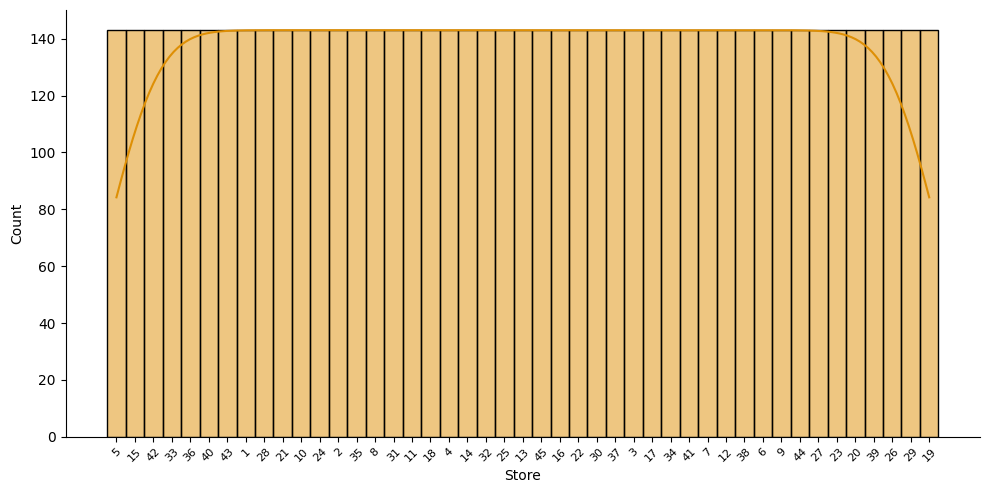

In [36]:
# Function 15 used

uni_analysis(df, 'Store', fontsize = 8, aspect = 2)


# Description about the distribution

The above kdehistplot shows:


*   Store feature is symmetric
*   And the there are equal no of observations for all the stores



# Weekly Sales

**Distribution**

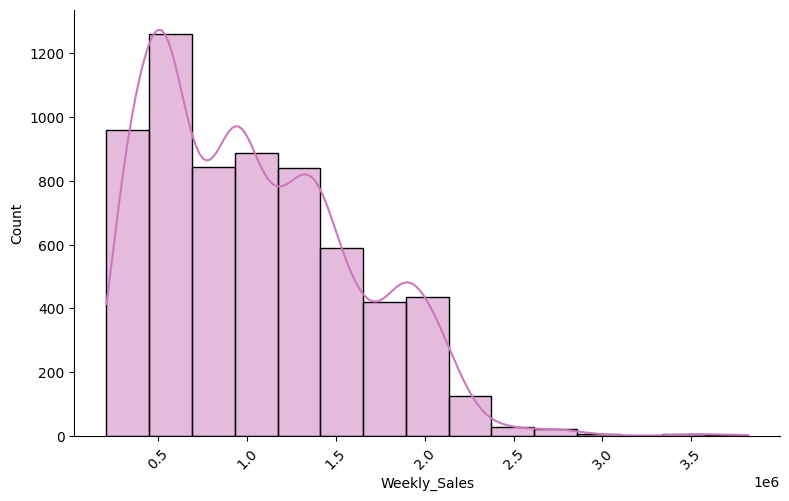

In [37]:
# Function 15 used

uni_analysis(df, 'Weekly_Sales')

# Description about distribution

The above kdehistplot shows:


*  Weekly Sales Of stores ranges from around 200000 to 3800000
*  from above distribution the most of the Weekly_sales happens around
   400000 to 600000 around 1200 categories of stores


*   There are few Weekly Sales happened around 2800000 to 3800000
*   It is right skewed distribution as Weekly_Sales is fluctuating
    variable






# Temperature

**Distribution**

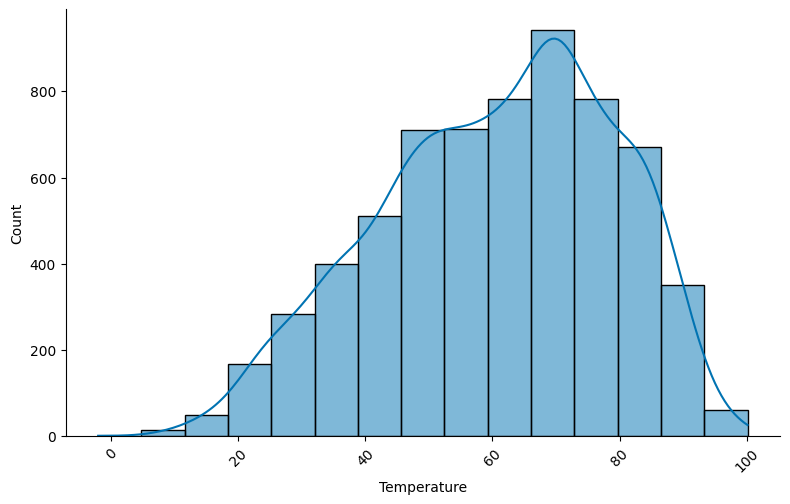

In [38]:
# Function 15 used

uni_analysis(df, 'Temperature')

# Description about Distribution

The above kdehistplot shows:


*   Stores opened in the temperature range from 5 degree to 100 degree
*   Most of the shop opened in the temperature of 64 degree to 70
    degrees




*   There are some store open in 10 and 100 degree

*   The data is left skewed











# Fuel Price

**DIstribution**

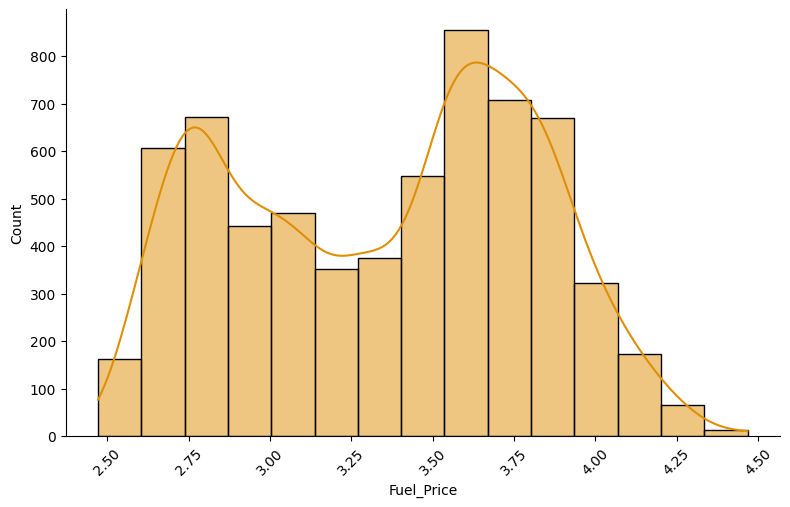

In [39]:
# Function 15 used

uni_analysis(df, "Fuel_Price")

# Description about Distribution

The above kdehistplots shows:


*   The distribution shows that there are stores who used fuel price
    ranging from 2.50 to 4.50
*   Most of the stores has fuel price of 2.75 to 2.85 and 3.52 to 3.70


*   There are some stores whose has fuel price of 2.50 and 4.50
*   The distribution is binomial and right skewed





# CPI

**Distribution**



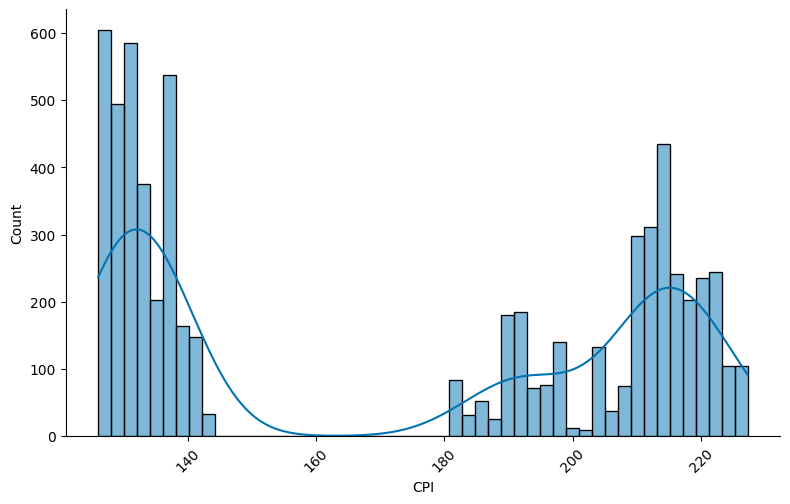

In [40]:
# Function 15 used

uni_analysis(df, 'CPI', bin = 50)

# Description above Distribution

The above kdehistplot shows:


*   In the above data it ranges from 120 to 227
*   There is gap between the data which ranges from 143 to 181


*   Most of entries od stores lies from 120 to 140
*   From above data it can be seen data is not smooth





# Unemployment

**Distribution**

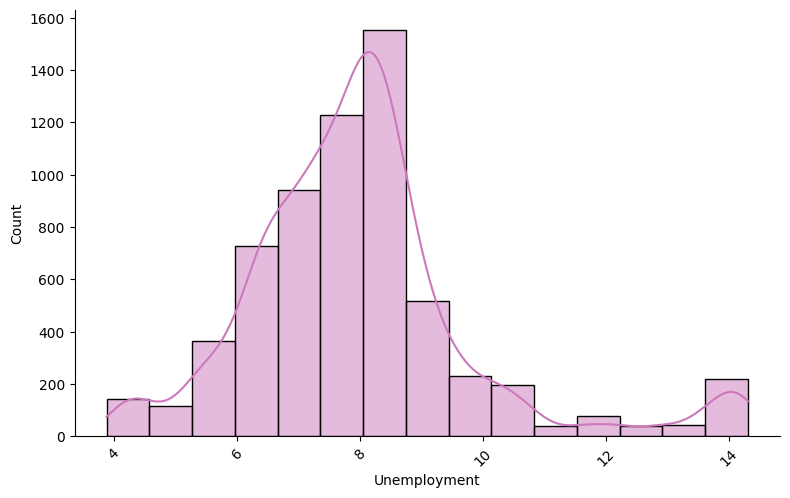

In [41]:
# Function 15 used

uni_analysis(df, 'Unemployment')

# Desciption about above Distribution

The above kdehistplot shows:


*   The data lies from 4 to 15 and mean lies to hte right side of median
*   The most of unemployment has happened in the rate of 8 to 8.5 which
    is entries of stores around 1550

*   The distribution seems to be little significant of heavy tail
    distribution





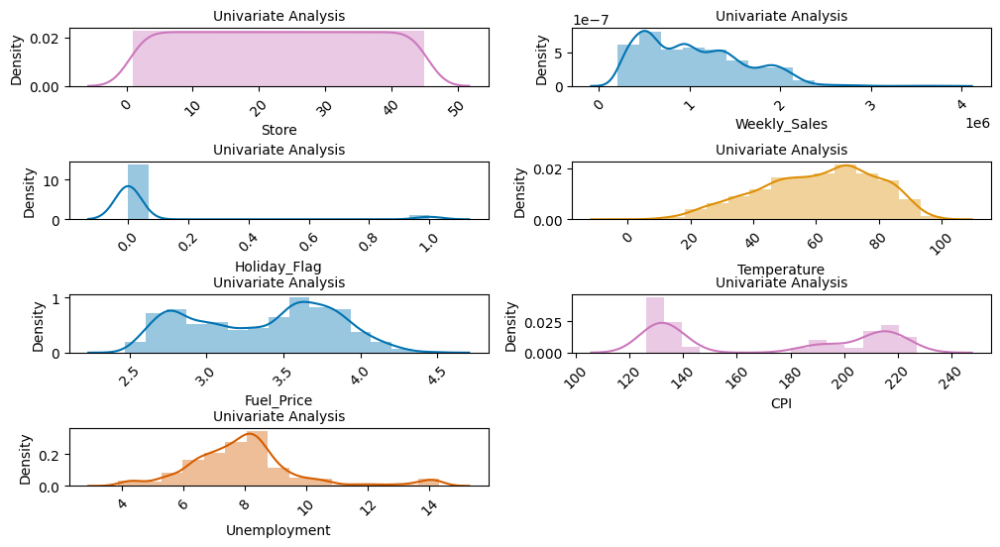

In [42]:
# Function 16 used

uni_tot_analysis(df2)

## Cocnlusion



*   There are equal no of entries of each 45 stores
*   Weekls sales happened for the stores is right skewed which means it has decreased


*   The Holiday flag shows that most of the sales has happened in holiday the non holiday day
*   Temperature has increased as temperature reaches in middle most of the entries are of moderate temperature


*   There is not proper distribution has varied differently from other distributions
*   CPI has also shown very high binomial distribtuion which states that inflation was there and it has started again.

*   Most of the entries of stores has be done when unemployment has been in moderate stage












## Multivariate Analysis

Relationship with Stores

For all Stores

In [43]:
# check the coreelation between dependent varianles(Weekly_Sale) and
# independent variables (Store, Holiday_flag, Temperature, Fuel_price, CPI, Unemployment)

df.corr()

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Weekly_Sales,1.000000,0.036891,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,0.036891,1.000000,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-0.063810,-0.155091,1.000000,0.144982,0.176888,0.101158
Fuel_Price,0.009464,-0.078347,0.144982,1.000000,-0.170642,-0.034684
CPI,-0.072634,-0.002162,0.176888,-0.170642,1.000000,-0.302020
Unemployment,-0.106176,0.010960,0.101158,-0.034684,-0.302020,1.000000


<Axes: >

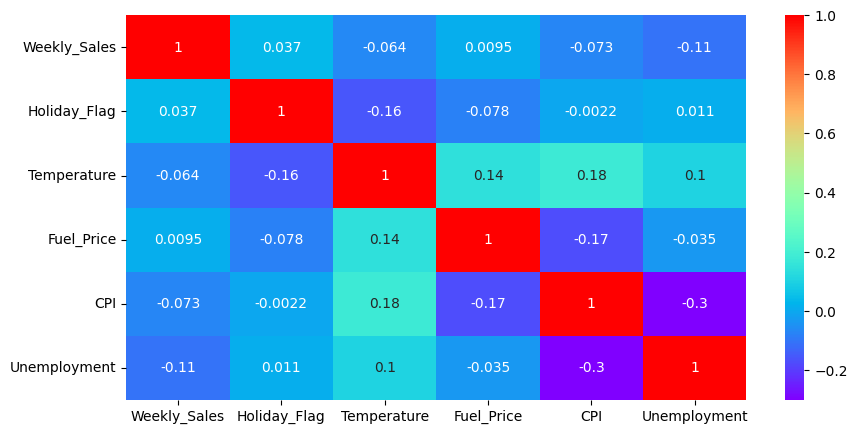

In [44]:
# plot correlation graph between all variables for relation between them

plt.figure(figsize = (10,5))
sns.heatmap(df.corr(), annot = True, cmap = 'rainbow' )

# Description about Distribution

The above heatmap shows relationship between variables:



*   The Holiday Flag variable has non significant relation between
    weekly sales mostly effected by Fuel Price of -0.078 correlation
*   The Temperature Variable has non significant reation with weekly     sales and mostly effected by CPI of +0.18 corr and then Holiday Flag of -0.16

*   The Weekly Sales has least relation with fuel price and it has most relation with CPI of -0.17 and temperature of +0.14
*   The CPI has non significant relation with Weekly Sales and it is mostly affected unemployment of -0.3 which is highest to be found then with temperature of +0.14

*   The Unemployment can be considered has highest relation with Weekly Sales among other variables of -0.11 and mostly effected by CPI of -0.3 and temperature of +0.1






# Inferences:

The above description providfes with following inferences


*   The Weekly sales is most related to the Unemployment and
    unemployment is mostly effected by CPI and CPI also effects mostly to the Temperature and Temperature as significant relation to the Fuel Price
*   So, generally the Weekly Sales depends upon four variable mostly they are CPI, Unemployment, Temperature, Fuel Price





### Checking Outliers

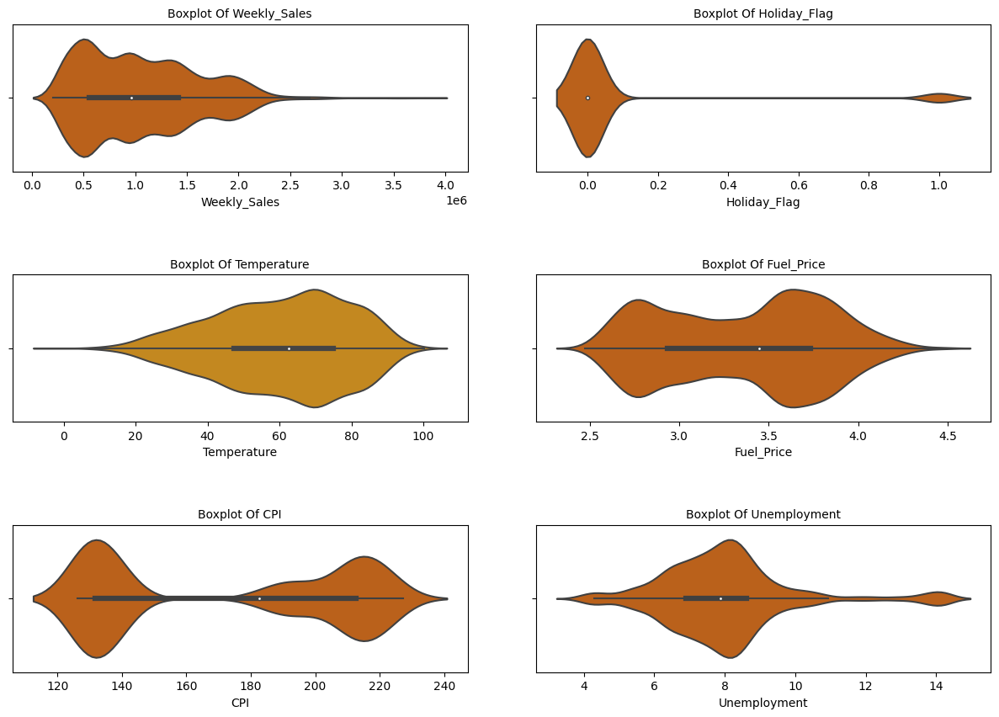

In [45]:
# Function 18 used

# Check Outliers

df['Store'] = df['Store'].astype('str')
check_outliers(df)


### Removing Outliers

The above violinplot shows that there are outliers present in Weekly Sales

In [25]:
# Removing Outliers
df_rem = outliers_removal(df2,['Weekly_Sales','Unemployment'])
df_rem

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-01-10,5,283178.12,0,71.10,2.603,212.226946,6.768
2010-01-10,15,566945.95,0,59.69,2.840,132.756800,8.067
2010-01-10,42,481523.93,0,86.01,3.001,126.234600,9.003
2010-01-10,33,224294.39,0,91.45,3.001,126.234600,9.265
2010-01-10,36,422169.47,0,74.66,2.567,210.440443,8.476
...,...,...,...,...,...,...,...
2012-12-10,41,1409544.97,0,39.38,3.760,199.053937,6.195
2012-12-10,16,491817.19,0,43.26,3.760,199.053937,5.847
2012-12-10,10,1713889.11,0,76.03,4.468,131.108333,6.943


## Correlation Of Dependent Variable with the Independent Variables for each Store


Text(0.5, 1.0, 'Weekly Sales Over Time')

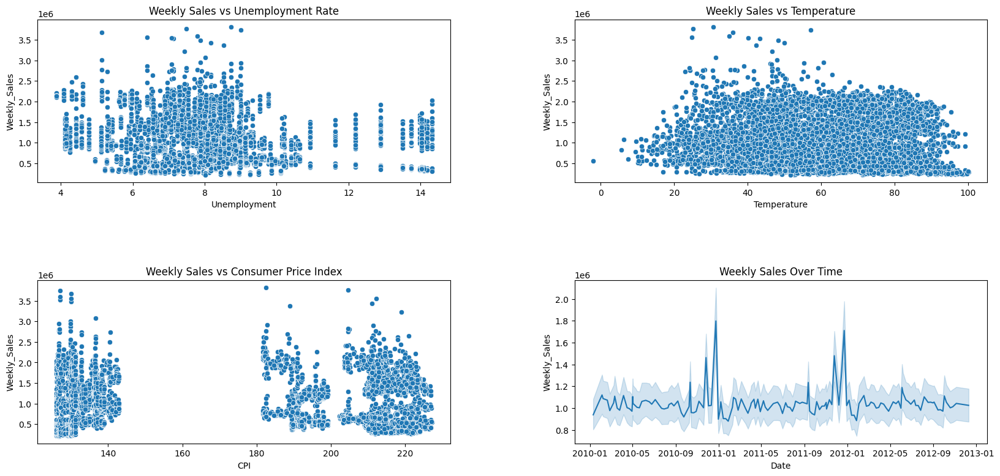

In [47]:
# Explorary data with visualisation

# def plot_relationship(df, x, y, hue=None, title=""):
#     plt.figure(figsize=(10, 3))
#     sns.scatterplot(data=df, x=x, y=y, hue=hue)
#     plt.title(title)
#     plt.show()



# plot_relationship(df2, 'Unemployment', 'Weekly_Sales', title='Weekly Sales vs Unemployment Rate')
# plot_relationship(df2, 'Temperature', 'Weekly_Sales', title='Weekly Sales vs Temperature')
# plot_relationship(df2, 'CPI', 'Weekly_Sales', title='Weekly Sales vs Consumer Price Index')
# # Visualizing Weekly Sales over time to observe seasonal trends

# plt.figure(figsize = (10,3))
# sns.lineplot(data=df2, x=df2.index, y='Weekly_Sales', ci=None)
# plt.title('Weekly Sales Over Time')
# plt.show()


fig, ax = plt.subplots(2,2, figsize = (20, 9))
plt.subplots_adjust(hspace = 0.6, wspace = 0.3)
plt.subplot(2,2,1)
sns.scatterplot(data = df2, x = 'Unemployment', y = 'Weekly_Sales', hue = None)
plt.title('Weekly Sales vs Unemployment Rate')
plt.subplot(2,2,2)
sns.scatterplot(data = df2, x= 'Temperature', y = 'Weekly_Sales', hue = None)
plt.title('Weekly Sales vs Temperature')
plt.subplot(2,2,3)
sns.scatterplot(data = df2, x = 'CPI', y = 'Weekly_Sales', hue = None)
plt.title('Weekly Sales vs Consumer Price Index')
plt.subplot(2,2,4)
sns.lineplot(data = df2, x = df2.index, y = 'Weekly_Sales', hue = None)
plt.title('Weekly Sales Over Time')

In [48]:
# It may be necessary to check the specific correlinearity between the target variable and the other variables for each store

store_corr = pd.DataFrame(index = ['Store', 'Weekly_Sales','Holiday_Flag', 'Temperature','Fuel_price', 'CPI','Unemployment'])
for i in range(1,46):
  store_df = get_store_df(df2, i, 'Store')
  store_corr[i] = store_df.corr()['Weekly_Sales'].tolist()

store_corr.dropna(inplace = True)
store_corr_T = store_corr.drop('Weekly_Sales').T

## Correlation of weekly sales with unemployment rate

In [49]:
corr_sales_unemployment = df['Unemployment'].corr(df['Weekly_Sales'])
print(f'Affect of unemmployment in weekly sales {corr_sales_unemployment}')

Affect of unemmployment in weekly sales -0.10617608965795419


In [50]:
# Function 13 used

corrl_stores_sep(store_corr_T, 'Unemployment')


 There are 16 stores whose Weekly Sales increase as Unemployment increases

 There are 29 stores whose Weekly Sales decreases as Unemployment increases


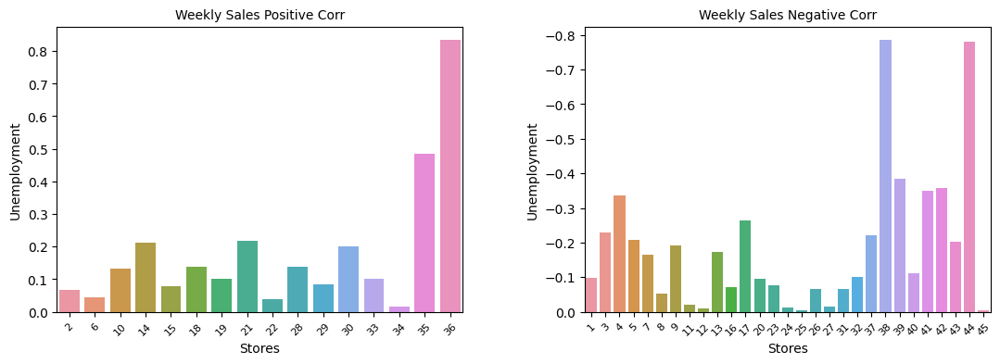

In [51]:
# Function 13 used

corrl_stores_sep_visual(store_corr_T, 'Unemployment')

Description about Distribution

The above barplots shows:


*   There is significant differnce between high positive correlation and high negative correlation between weekly sales and unemployment rate


*   There is a weak negative correlation between unemployment rate and weekly sales of -0.10617608965795419 suggesting that higher unemployment rates might be associated with slightly lower sales, but the relationship is not strong.



*   The stores mostly shows the realtion are store:
      

*   Positive correlation stores like 35,36
*   Negative correlation stores like 38,44





# Statistical Testing

Using t-Test



Hypothesis

In [52]:
# H0 :- There is no significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate
# H1 :- There is significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate

high_unemployment_rate = df[df['Unemployment'] > df['Unemployment'].median()]
low_unemployment_rate = df[df['Unemployment'] < df['Unemployment'].median()]

Perform Test

In [53]:
from scipy.stats import ttest_ind

t_stat, p_val = ttest_ind(high_unemployment_rate['Weekly_Sales'], low_unemployment_rate['Weekly_Sales'], equal_var = False)

if p_val < 0.05:
  print('Reject Null hypothesis: \n\nThere is significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate')
else:
  print('Accept Null hypothesis: \n\nThere is no significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate')

Reject Null hypothesis: 

There is significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate


The Stores affected by Unemployment rate

In [54]:
from sklearn.linear_model import LinearRegression

lin_model = LinearRegression()

impact_data = pd.DataFrame(columns = ['Store_no','Impact'])
for i in range(1,46):
  store_val = get_store_df(df2, i)
  x = store_val[['Unemployment']]
  y = store_val['Weekly_Sales']
  lin_model.fit(x,y)
  impact_data = impact_data.append({'Store_no' : i, 'Impact' : abs(lin_model.coef_[0])}, ignore_index = True)

In [55]:
impact_data = impact_data.sort_values(by = 'Impact', ascending = False)
impact_data.set_index(impact_data['Store_no'], inplace = True)
impact_data.drop('Store_no', axis = 1, inplace = True)

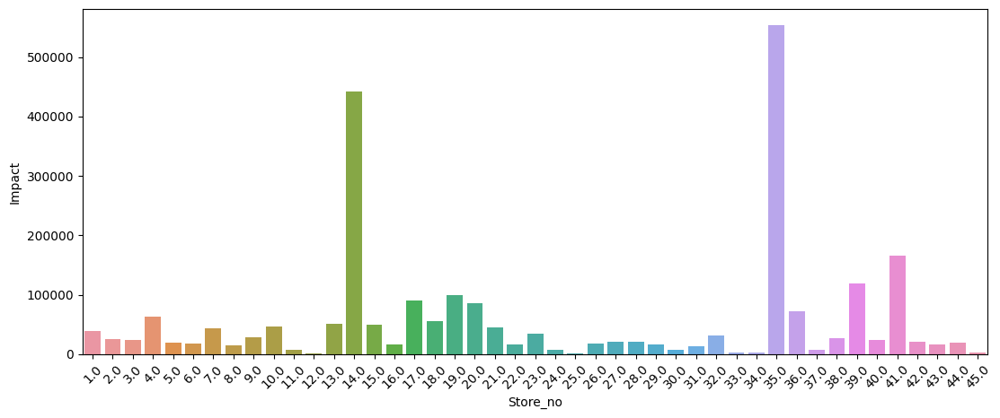

In [56]:
plt.figure(figsize = (13,5))
sns.barplot(x = impact_data.index, y = impact_data['Impact'])
plt.xticks(rotation = 45)
plt.show()

## Conclusion

*  The Unemmployment affesct weekly sales negatively which overall as unemployment increases sales is decreasing having correlation of
 -0.10617608965795419




*   There is significant difference between Weekly Sales of Stores having high unemployment rate and low unemployment rate


*   There is a weak negative correlation between unemployment rate and weekly sales of -0.10617608965795419 suggesting that higher unemployment rates might be associated with slightly lower sales, but the relationship is not strong.



*   There are 16 stores whose Weekly Sales increase as Unemployment increases

*   There are 29 stores whose Weekly Sales decreases as Unemployment increases
*   List item







*   There are two stores which are most impacted by Unemployment rate are

*   Store:- 14, 35




## for Seasonality in Weekly Sales

### Adfuller test

For seasonality test




<Axes: title={'center': 'Weekly Sales Seasonality and Trend'}, xlabel='Date'>

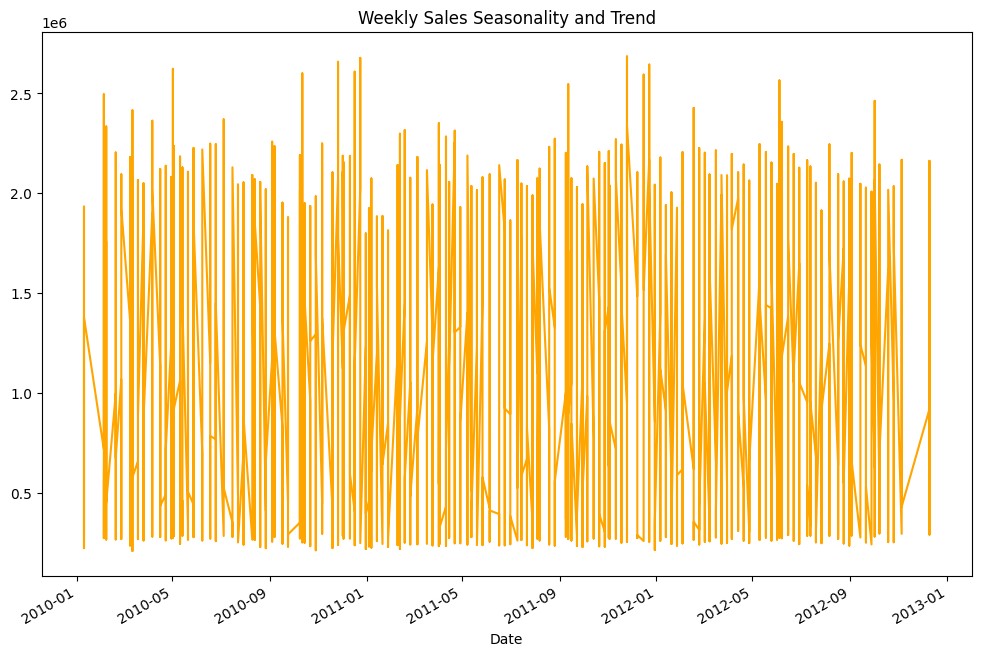

In [63]:
# plotting sales data of all stores

df_rem['Weekly_Sales'].plot(figsize = (12,8), title = 'Weekly Sales Seasonality and Trend', color = 'orange')

Resampling the above sales for better visualization

In [57]:
# Resmapling of the Weekly Sales is Done for seting the frequency of data to none
# Resampling is done on addition of weeks in weekly sales


resampled_data = df.resample('W').sum()

<Axes: title={'center': 'Weekly Sales Seasonality and Trend'}, xlabel='Date'>

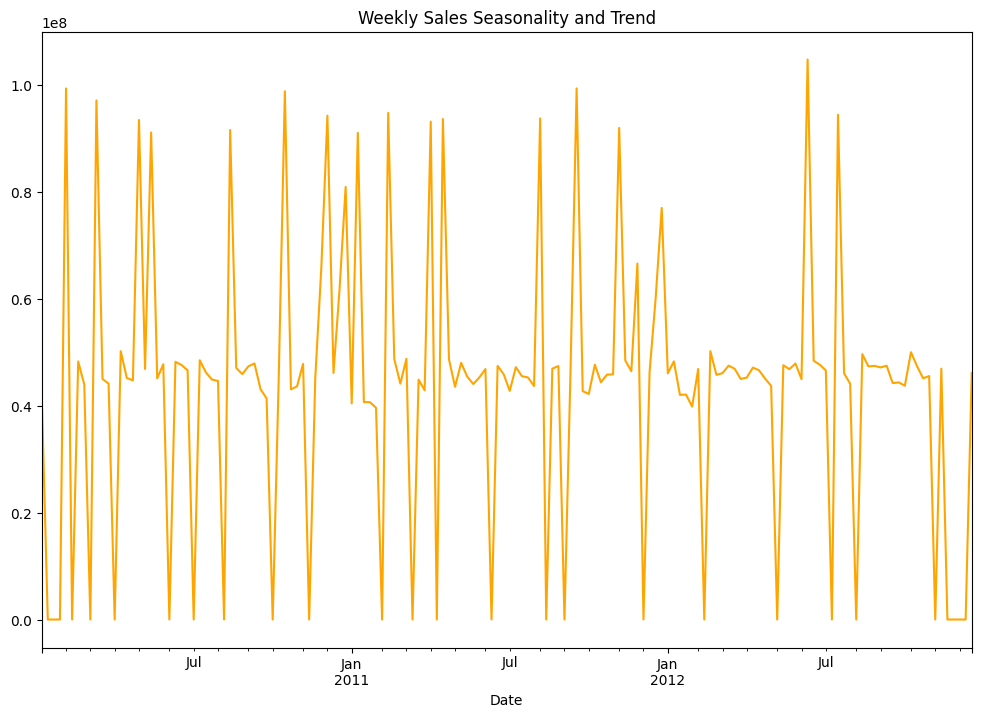

In [70]:
# To check Weekly sales for seasonal trends

resampled_data['Weekly_Sales'].plot(figsize = (12,8), title = 'Weekly Sales Seasonality and Trend', color = 'orange')

In [64]:
# we will be using adfuller test(augumnented diek fuller test)

# H0: data is not stationary
# H1: data is stationary

ad_res = adfuller(resampled_data['Weekly_Sales'])
p_val = ad_res[1]

if p_val < 0.05:
  print('Reject Null hypothesis: Data is Stationary')
else:
  print('Accept Null hypothesis: Data is Non Stationary')

Reject Null hypothesis: Data is Stationary


Seasonal Decompose

To check Seasonality

<Axes: xlabel='Date'>

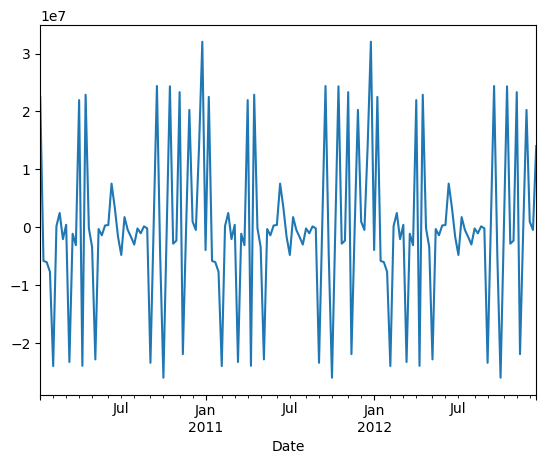

In [71]:
sea_res = seasonal_decompose(resampled_data['Weekly_Sales'])
seasonal = sea_res.seasonal
seasonal.plot()

### Inference

From the above seasonal graph we can see that there seasonal peaks present in the Weekly sales data



*   Seasonal component shows a patterns of 12 months intervals but clearly cannot be stated



## Reasons Behind Seasonality

Checking Holiday with Weekly Sales

Statistical Testing

In [63]:
# Assuming in Holiday column 0 means holiday and 1 means non holiday

# Hypothesis

# H0:- Weekly Sales happens in holiday are not significant from non holiday day
# H1:- Weekly Sales happens in holiday are significant from non holiday day
holiday_data = df[df['Holiday_Flag'] == 1]
non_holiday_data = df[df['Holiday_Flag'] == 0]

from scipy.stats import ttest_ind

t_test, p_val = ttest_ind(holiday_data['Weekly_Sales'], non_holiday_data['Weekly_Sales'])

if p_val < 0.05:
  print('Reject Null Hypothesis: \n\nWeekly Sales happens in holiday are significant from non holiday day')
else:
  print('Accept Null Hypothesis: \n\nWeekly Sales happens in holiday are not significant from non holiday day')

Reject Null Hypothesis: 

Weekly Sales happens in holiday are significant from non holiday day


Visualization of Weekly Sales and Holiday

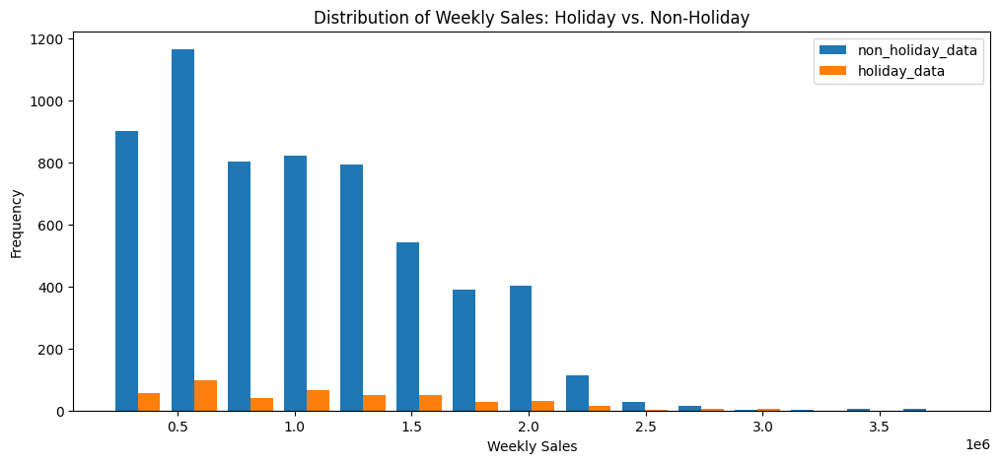

In [64]:
plt.figure(figsize = (12,5))
plt.hist([non_holiday_data['Weekly_Sales'],holiday_data['Weekly_Sales']], bins = 15, label = ['non_holiday_data','holiday_data'])
plt.xlabel('Weekly Sales')
plt.ylabel('Frequency')
plt.title('Distribution of Weekly Sales: Holiday vs. Non-Holiday')
plt.legend(loc = 'best')
plt.show()

Checking Weekly sales with temperature

Statistical Testing

In [65]:
high_temp = df2[df2['Temperature'] > df2['Temperature'].median()]
low_temp = df2[df2['Temperature'] < df2['Temperature'].median()]

In [66]:
from scipy.stats import ttest_ind

t_test, p_val = ttest_ind(high_temp['Weekly_Sales'], low_temp['Weekly_Sales'], equal_var=False)
if p_val < 0.05:
  print('there is significance differnce between weekly sales of high temperature and low temperature')
else:
  print('there is no significance differnce between weekly sales of high temperature and low temperature')

there is significance differnce between weekly sales of high temperature and low temperature


Visualization of Weekly Sales and Temperature

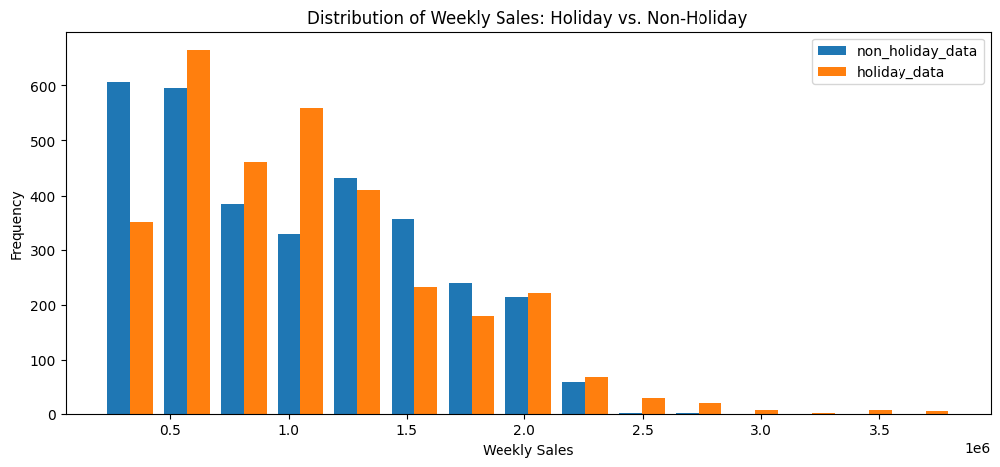

In [67]:
plt.figure(figsize = (12,5))
plt.hist([high_temp['Weekly_Sales'],low_temp['Weekly_Sales']], bins = 15, label = ['non_holiday_data','holiday_data'])
plt.xlabel('Weekly Sales')
plt.ylabel('Frequency')
plt.title('Distribution of Weekly Sales: Holiday vs. Non-Holiday')
plt.legend(loc = 'best')
plt.show()

## Inference


*   Weekly Sales happens in holiday are significant from non holiday day
*   From above statistical testing we can see that Weekly Sales is greatly affected by holiday and non holiday day

*    From above statistical testing we can see that there is difference in higher temperature sales and lower temperature sales




Conclusion:


    

*   During Non Holiday there are more Sales happening then holiday day
results in seasonality in sales



*   If the termperature is high then Weekly sales decreases and temperature decreases sales increases so the temperature can affect seasonality of sales



*   From above all inferences we can come to a conclusion that seasonality peaks hapeening may be directlt realted to temperature and hoilday as we can obsereve that in last two and half months there are more hoildays and temperature low which results in seasonality peaks


### Correlating Temperature and Weekly Sales

In [68]:
corr_temp_sales = df['Weekly_Sales'].corr(df['Temperature'])
print(f"Affect of Temperature and Weekly Sales: {corr_temp_sales}")

Affect of Temperature and Weekly Sales: -0.06381001317946958


In [69]:
# Function 13 used

corrl_stores_sep(store_corr_T, 'Temperature')


 There are 15 stores whose Weekly Sales increase as Temperature increases

 There are 30 stores whose Weekly Sales decreases as Temperature increases


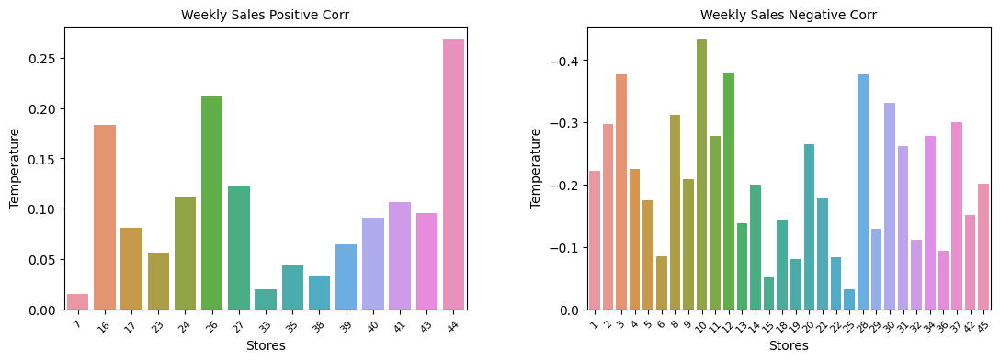

In [70]:
# Function 13 used

corrl_stores_sep_visual(store_corr_T, 'Temperature')

Conclusion



*  The Temperature affects weekly sales in negative way which may result that as temperature increases sales decreases. It states that during hot temperature sales happens are less than sales happens in cold temperature

*   There are only 15 stores whose sales increases but around 30 stores whose sales goes down as temperature increases


*   The correlation between temperature and weekly sales is -0.06381001317946958 and also weak and negative indicating that temperature has a minimal direct impact on sales.





### Correlating CPI and Weekly Sales

In [71]:
corr_CPI_sales = df['Weekly_Sales'].corr(df['CPI'])
print(f"Affect of CPI and Weekly Sales: {corr_CPI_sales}")

Affect of CPI and Weekly Sales: -0.07263416204017628


In [72]:
# Function 13 used

corrl_stores_sep(store_corr_T, 'CPI')


 There are 25 stores whose Weekly Sales increase as CPI increases

 There are 20 stores whose Weekly Sales decreases as CPI increases


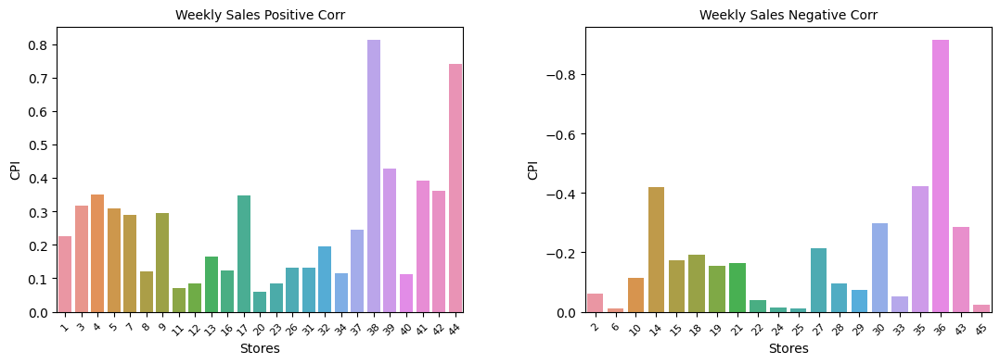

In [73]:
# Function 13 used

corrl_stores_sep_visual(store_corr_T, 'CPI')

Conclusion


*   Affect of CPI on weekly sales is negative correlation of -0.07263416204017628

*   Which indicates that as inflation increases there are less sales hapening when there is deflation

*   There are still 25 stores whose sales as inflation increases and 20 stores where whose sales is decreasing
*   Similar to the other factors, CPI has a weak negative correlation with weekly sales -0.07263416204017628 which suggests that as CPI increases, weekly sales might decrease slightly, although the effect is weak.






### Sales of all Stores

In [74]:
tot_sales_df = pd.DataFrame()
for i in df2['Store'].unique().tolist():
  store_df = get_store_df(df2,i)
  tot_sales_df = tot_sales_df.append({'Store': i, 'tot_sales':store_df['Weekly_Sales'].sum()}, ignore_index = True)
tot_sales_df=tot_sales_df.sort_values(by = 'tot_sales', ascending = False)
tot_sales_df['Store'] = tot_sales_df['Store'].astype(int)

Top Performing Stores

In [75]:
# Top 5 Performing Stores

top_stores = df2.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False)
top_stores[:5]

Store
20    3.013978e+08
4     2.995440e+08
14    2.889999e+08
13    2.865177e+08
2     2.753824e+08
Name: Weekly_Sales, dtype: float64

Cocnlusion:

1. Top Performing Store is:
Store 20

2. The top five stores, led by store number 20, have significantly higher average weekly sales compared to others

In [76]:
# least Performing Store

worst_store = top_stores.idxmin()
worst_store_sales = top_stores.min()
sales_difference = top_stores.max() - worst_store_sales

print(f"The store having minimum performance is Store:- {worst_store} having sales of {worst_store_sales}")
print(f"\nThe differnce between Top performing store and worst performing store is {sales_difference}")

The store having minimum performance is Store:- 33 having sales of 37160221.96

The differnce between Top performing store and worst performing store is 264237570.49999997


Cocnlusion:





*   Worst Performing Store is:



1.    Store 33



*   The difference between the highest and lowest performing stores in terms of weekly sales is approximately 1847815.17.







### Model Features Selection

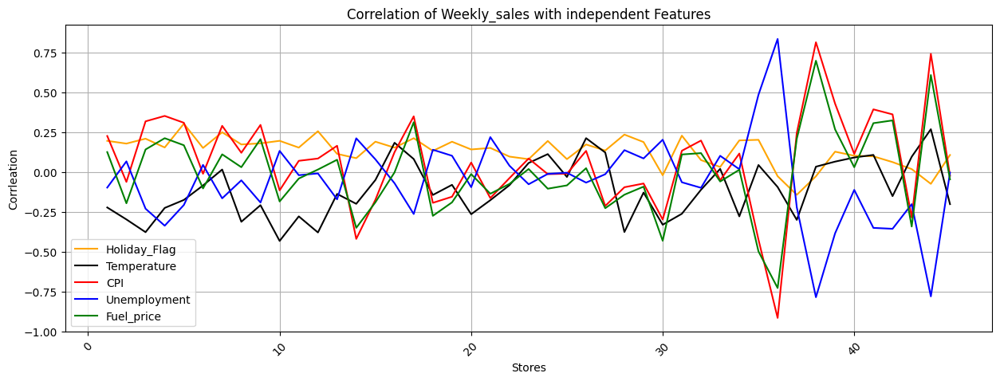

In [77]:
# Function 14 used

graph_of_correlation(store_corr_T)

## Correlation Of features with Weekly Sales

Holiday_Flag VS Weekly Sales

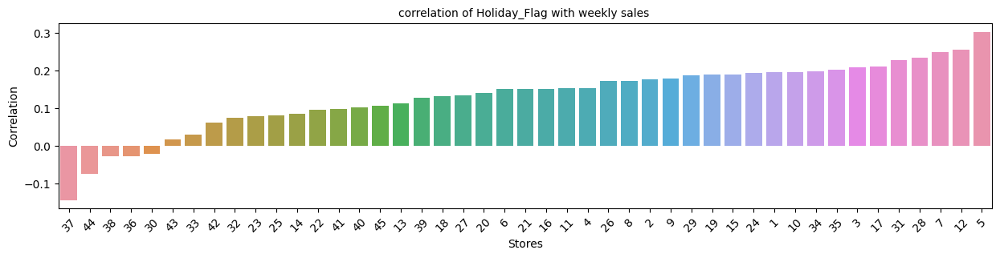

In [78]:
# Function 11 used

corrl_store_single(store_corr_T, 'Holiday_Flag')

Temperature VS Weekly Sales

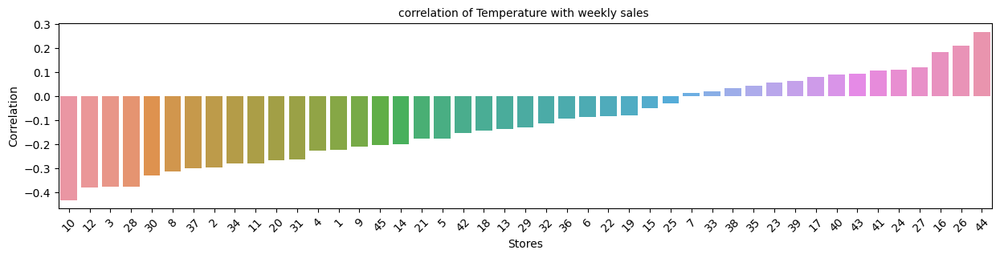

In [79]:
# Function 11 used

corrl_store_single(store_corr_T, 'Temperature')

CPI VS Weekly Sales

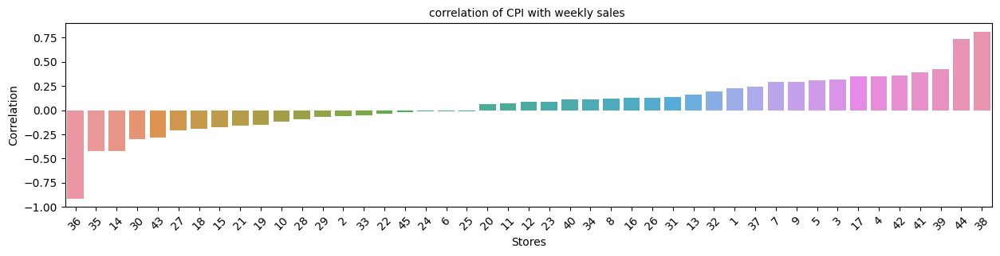

In [80]:
# Function 11 used

corrl_store_single(store_corr_T, 'CPI')

Unemployment VS Weekly Sales

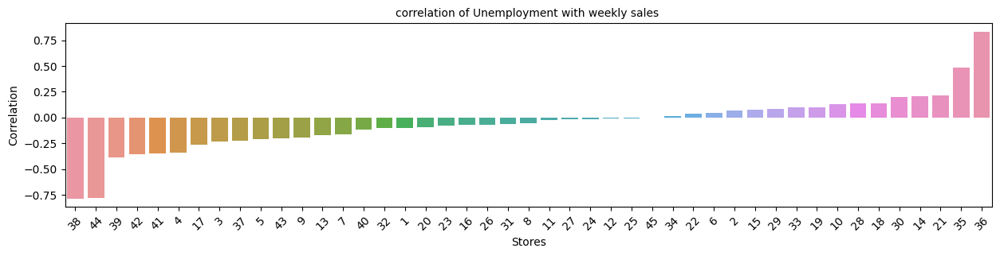

In [81]:
# Function 11 used

corrl_store_single(store_corr_T, 'Unemployment')

### Description





*   From above graph of correlation of features with Weekly Sales we can observe that holiday flag, Temperature, Unemployment are having significance difference with other features plot

*   But CPI, Fuel_price are showing Colinearity so from those two we could choose any of the feature



Conclusion:-



*   Feature selected are:- Holiday Flag, Temperature, Unemployment, CPI
*   From above correlation we can see that every stores have different correlation with weekly sales

*   So from above we can come to conclusion we have to use model for every stores for the predictions





# Inferences

## Temperature Effects on Weekly Sales


Evaluation of how changes in temperature effects the weekly sales revenue is presented Below

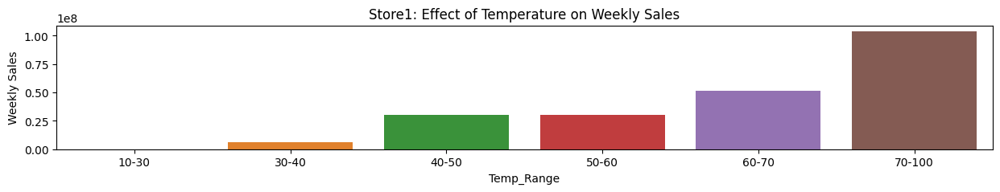

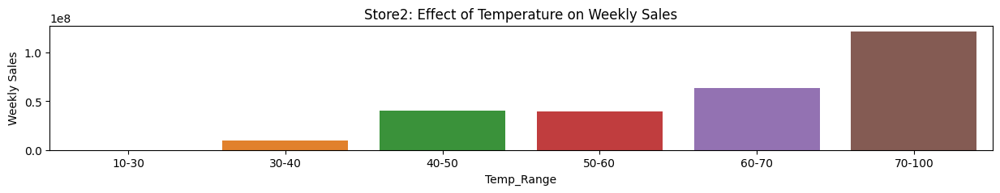

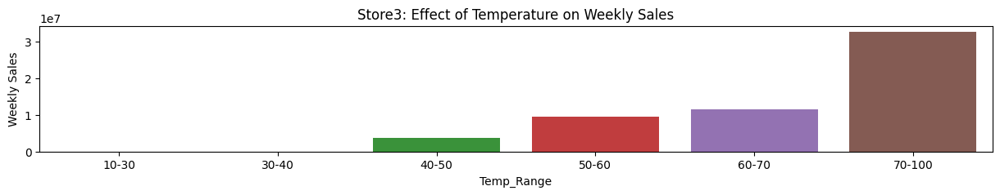

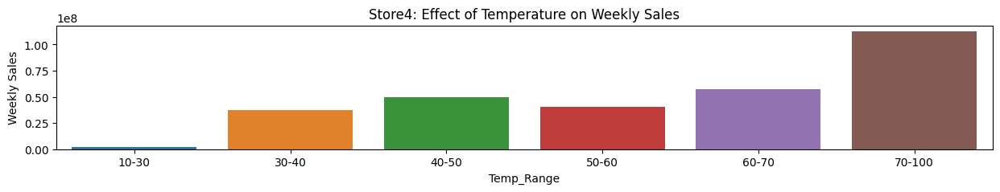

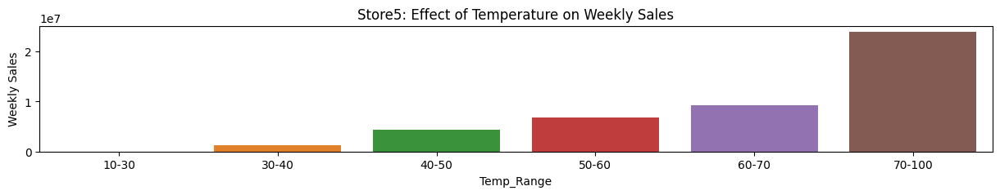

...

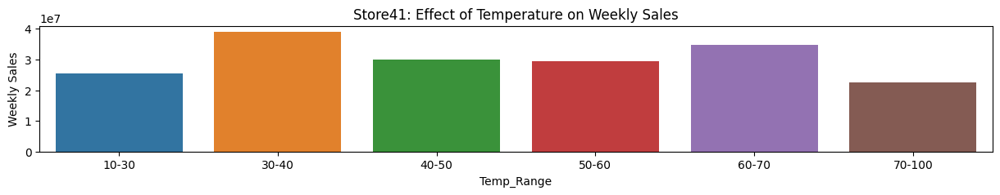

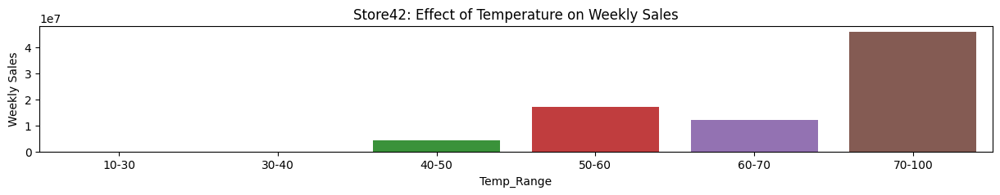

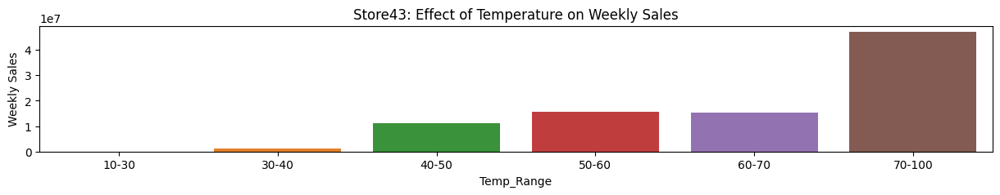

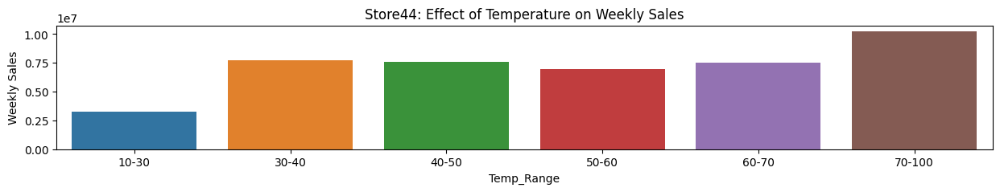

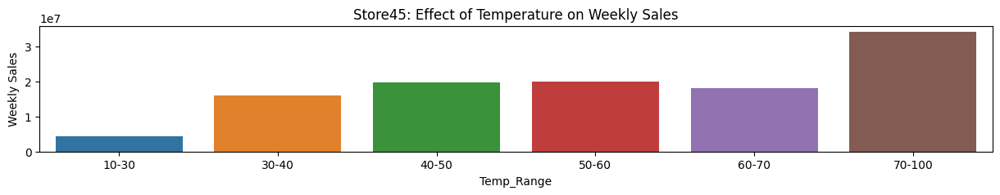

In [152]:
df3 = df2.copy()
bins = [10, 30, 40, 50, 60, 70, 100]
labels = ['10-30', '30-40', '40-50', '50-60', '60-70', '70-100']
walmart_data = pd.DataFrame()
# Create a new column 'Temp_Range' for the temperature range
df3['Temp_Range'] = pd.cut(df3['Temperature'],bins = bins, labels=labels, right=False)
grouped_data = df3.groupby(['Store', 'Temp_Range'])['Weekly_Sales'].sum().reset_index()
store_list = list(grouped_data['Store'].unique())
for i in store_list:
  grouped_store = grouped_data[grouped_data['Store'] == i]
  plt.figure(figsize = (15,2))
  sns.barplot(data = grouped_store, x = grouped_store['Temp_Range'], y = grouped_store['Weekly_Sales'])
  plt.title(f"Store{i}: Effect of Temperature on Weekly Sales")
  plt.ylabel('Weekly Sales')

## Model Evaluation and Techniques

For Model Selction and Predictions we will be selecting some stores from readings taken above which are mostly impacted by various features for having better accuracy .



*   Most impacted store from unemployment
*   Store:- 14,35, 27


*      Most impacted store from Temperature
*   Store:- 44, 25, 1
*      Most impacted store from CPI
*   Store:- 33, 26, 38










### Choosing best model for Stores

In [82]:
store_lis = [14,35,27,44,25,1, 33, 26,38]
best_model = pd.DataFrame(columns = ['Store','LinearRegression','GradientBoosting','RandomForestRegressor'])
models_cv_result = pd.DataFrame(columns = ['Store','name','cv_result'])
models_cv_mean_std = pd.DataFrame(columns = ['Store','name','cv_mean','cv_std'])
result = {}

name = []
models = []
models.append(('LR', LinearRegression()))
models.append(('GB', GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, random_state=42)))
models.append(('RF', RandomForestRegressor(n_estimators=200, max_features=3, random_state=42)))

for i in store_lis:
  store = get_store_df(df_rem, i)
  store.drop('Fuel_Price', axis = 1, inplace = True)
  array = store.values
  X = array[:,2:6]
  y = array[:,1:2]
  X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42 )

  for name , model in models:
    cv_results = []
    kfold = KFold(n_splits=10)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    models_cv_mean_std = models_cv_mean_std.append({'Store':i,'name':name, 'cv_mean':cv_results.mean(), 'cv_std':cv_results.std()}, ignore_index=True)
    models_cv_result = models_cv_result.append({'Store':i,'name':name, 'cv_result':cv_results},ignore_index=True)

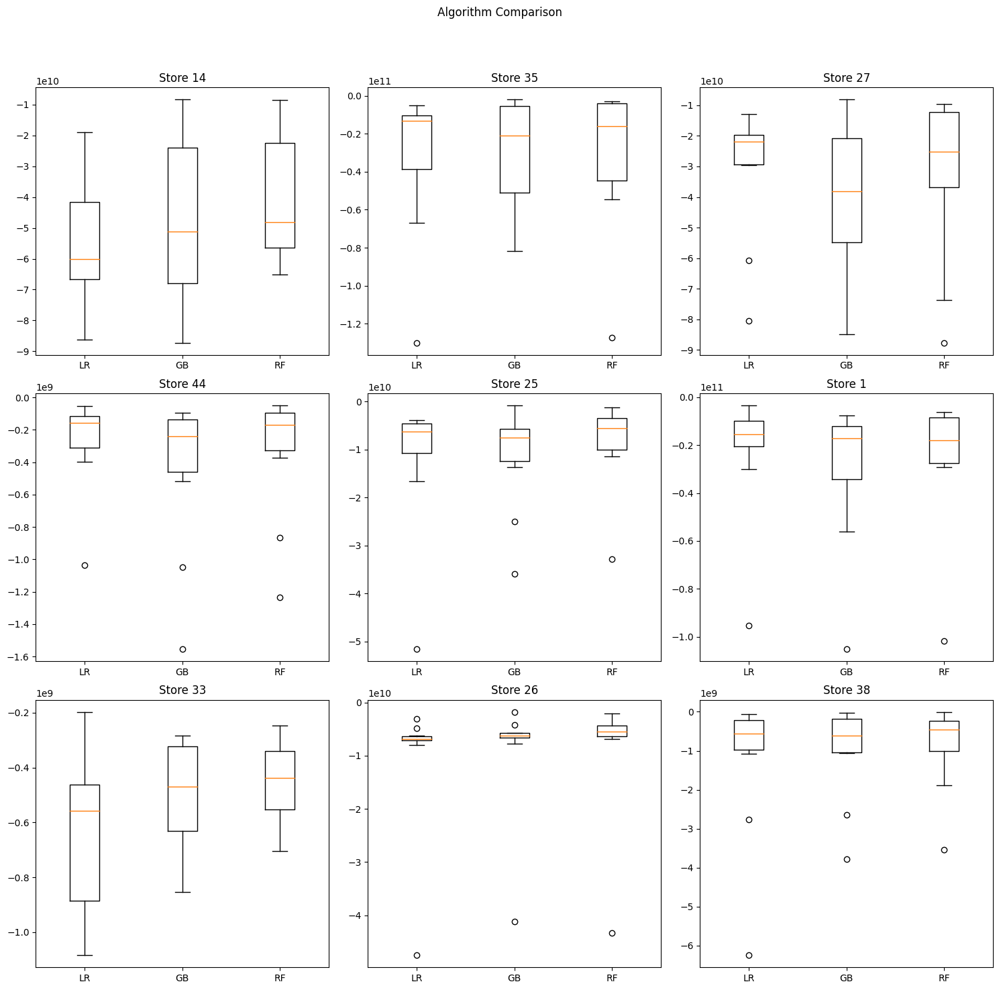

In [83]:
store_lis = [14, 35, 27, 44, 25, 1, 33, 26, 38]
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.suptitle('Algorithm Comparison')
axes = axes.flatten()

for k, i in enumerate(store_lis):
  cv_result_df = get_store_df(models_cv_result, i)
  results = []
  names = ['LR', 'GB', 'RF']
  cv_result_df_index = cv_result_df.index.tolist()
  for j in cv_result_df_index:
    results.append(cv_result_df['cv_result'][j])
  ax = axes[k]
  ax.boxplot(results)
  ax.set_xticklabels(names)
  ax.set_title(f'Store {i}')
for i in range(len(store_list), len(axes)):
  fig.delaxes(axes[i])
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

Conclusion:-



*   The above is of negative mean squared error it represents that which model has negative mean squared error closer to 0 is the better model.



*   From above store we can see that Random Forest Regressor and Gradient Boosting has better model cross val score tham other model

*   In some case Linear Regression and Random Forest has shown better prediction like for LR Store:- 1,44,33 and RF Store:- 26,38. But we will be using Gradient Boosting as its showing overall better results as it calculates  most of oultiers of the data. So
Gradient Boosting is used for Prediction





## Finalize Model With Best Tuning for all stores or selected Stores

Prediction for Top 5 Performance Store

#                      





In [84]:
tot_sales_df.head(8)

,Store,tot_sales
40,20,3.013978e+08
18,4,2.995440e+08
19,14,2.889999e+08
22,13,2.865177e+08
12,2,2.753824e+08
10,10,2.716177e+08
38,27,2.538559e+08
35,6,2.237561e+08


### Plot Top ten Stores for Visulalization

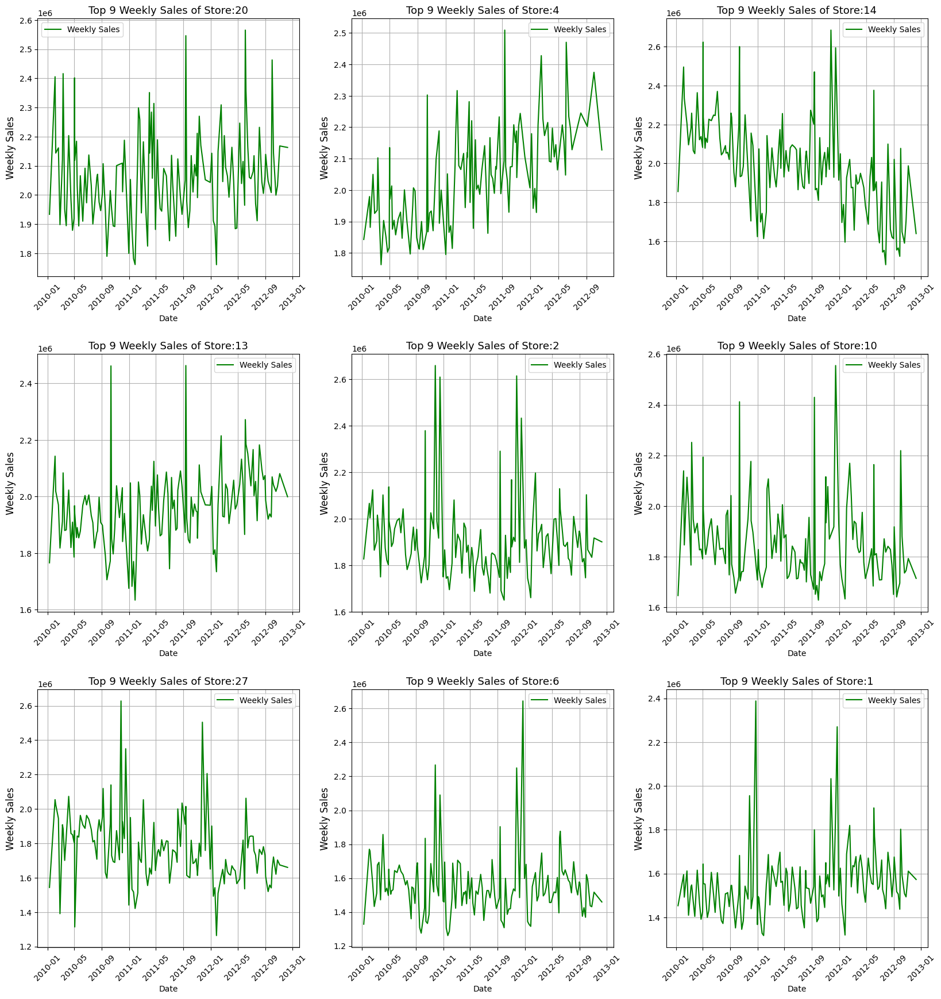

In [85]:
# Function 6 used

# Visualization of Weekly Sales of Selected Stores
top_ten = tot_sales_df.iloc[:9]['Store'].unique().tolist()
plot_sales(top_ten)

## Training and Predicting values for all Stores or Selected Stores

Selecting best hyperparameters and doing tests

In [86]:
info_df = pd.DataFrame(columns=['Store', 'model','train_Actual','train_Predict', 'test_Actual', 'test_Predict','total_Actual','total_Predict','train_date','test_date','forecast_y_Date','forecast_y_test','forecast_test_data', 'total_date', 'no_of_estimators', 'max_features','max_depth'] )
store_list = [20,4,14,13,2,10,27,6]
for i in store_list:
  fin_store = get_store_df(df_rem, i)
  fin_store.drop('Fuel_Price', axis = 1, inplace = True)
  array = fin_store.values
  X = array[:,2:6]
  y = array[:,1:2]
  z = fin_store.index
  # Split Data Into Train and Test
  X_train, X_test, y_train, y_test, z_train_date, z_test_date = train_test_split(X, y, z, train_size=0.75, random_state=42 )
  # Forecast y-Test data
  test_index = len(fin_store)//5
  forecast_X_test = X[-test_index:]
  forecast_y_test = y[-test_index:]
  forecsat_y_date = z[-test_index:]
  # Hyper paramenters to be used for algorithm Tuning
  n_estimators = np.array([50,100,150,200,250])
  max_features = np.array([1,2,3,4,5])
  max_depth= [3, 4, 5, 6, 7]



  # Searching best hyperparamenters for Rnadom Forest
  param_grid = dict(n_estimators=n_estimators,max_features=max_features, max_depth = max_depth)
  model = RandomForestRegressor()
  kfold = KFold(n_splits=10, random_state=42, shuffle = True)
  grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=kfold)
  grid_result = grid.fit(X_train, y_train)
  # Perdicting value by randomfroest model by using best parameters
  rf_model = RandomForestRegressor(n_estimators=grid_result.best_params_['n_estimators'], max_features=grid_result.best_params_['max_features'])
  rf_model.fit(X_train, y_train)
  rf_pred_test = rf_model.predict(X_test)
  rf_pred_train = rf_model.predict(X_train)
  rf_forecast_test = rf_model.predict(forecast_X_test)
  # appending values got from the process
  info_df = info_df.append({'Store':i, 'model': 'RF','train_Actual':y_train,'train_Predict':rf_pred_train,
                            'test_Actual':y_test, 'test_Predict':rf_pred_test,'forecast_y_test':forecast_y_test,'forecast_test_data':rf_forecast_test,'forecast_y_Date':forecsat_y_date, 'train_date':z_train_date, 'test_date':z_test_date ,
                            'no_of_estimators':grid_result.best_params_['n_estimators'], 'max_features':grid_result.best_params_['max_features'],
                            'max_depth':grid_result.best_params_['max_depth']}, ignore_index=True)


  # Using linear Regression model for prediction
  li_model = LinearRegression()
  li_model.fit(X_train, y_train)
  li_pred_test = li_model.predict(X_test)
  li_pred_train = li_model.predict(X_train)
  li_forecast_test = li_model.predict(forecast_X_test)
  # appending values got from the process
  info_df = info_df.append({'Store':i, 'model': 'LR','train_Actual':y_train,'train_Predict':li_pred_train,
                            'test_Actual':y_test, 'test_Predict':li_pred_test,'forecast_y_test':forecast_y_test,'forecast_test_data':li_forecast_test,'forecast_y_Date':forecsat_y_date,'train_date':z_train_date, 'test_date':z_test_date ,
                            'no_of_estimators':None, 'max_features':None,'max_depth':None}, ignore_index=True)


  # searching best parameters for gradient boosting model
  param_grid1 = dict(n_estimators=n_estimators, max_depth = max_depth)
  model1 = GradientBoostingRegressor()
  grid1 = GridSearchCV(estimator=model1, param_grid=param_grid1, scoring='neg_mean_squared_error', cv=kfold)
  grid_result1 = grid1.fit(X_train, y_train)
  # Predictiong values by gradient boosting model using best hyper parameters
  gb_model = GradientBoostingRegressor(n_estimators = grid_result1.best_params_['n_estimators'],max_depth = grid_result1.best_params_['max_depth'])
  gb_model.fit(X_train, y_train)
  gb_pred_test = gb_model.predict(X_test)
  gb_pred_train = gb_model.predict(X_train)
  gb_forecast_test = gb_model.predict(forecast_X_test)
  # appending values got from the process
  info_df = info_df.append({'Store':i, 'model': 'GB', 'train_Actual':y_train,'train_Predict':gb_pred_train,
                            'test_Actual':y_test, 'test_Predict':gb_pred_test,'forecast_y_test':forecast_y_test,'forecast_test_data':gb_forecast_test,'forecast_y_Date':forecsat_y_date,'train_date':z_train_date, 'test_date':z_test_date ,
                            'no_of_estimators':grid_result1.best_params_['n_estimators'], 'max_features':None, 'max_depth':grid_result1.best_params_['max_depth']}, ignore_index=True)

# info_df1['total_Actual'] = None
# info_df1['total_Predict'] = None
# info_df1['total_date'] = None

for i in info_df.index.tolist():
  info_df.at[i, 'total_Actual'] = np.array(info_df['train_Actual'][i].tolist()+info_df['test_Actual'][i].tolist())
  info_df.at[i, 'total_Predict'] = np.array(info_df['train_Predict'][i].tolist()+info_df['test_Predict'][i].tolist())
  info_df.at[i, 'total_date'] = np.array(info_df['train_date'][i].tolist()+ info_df['test_date'][i].tolist())

In [87]:
info_df1 = info_df.copy()

In [88]:
info_df1

,Store,model,train_Actual,train_Predict,test_Actual,test_Predict,total_Actual,total_Predict,train_date,test_date,forecast_y_Date,forecast_y_test,forecast_test_data,total_date,no_of_estimators,max_features,max_depth
0,20,RF,"[[1933719.21], [2094515.71], [2074721.74], [19...","[1955334.5565999988, 2053180.7523999983, 21042...","[[1858440.92], [2053165.41], [2313861.81], [21...","[1982261.3638000018, 2048217.4372, 2042988.347...","[[1933719.21], [2094515.71], [2074721.74], [19...","[1955334.5565999988, 2053180.7523999983, 21042...","DatetimeIndex(['2010-01-10', '2012-03-08', '20...","DatetimeIndex(['2011-07-29', '2011-01-07', '20...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[[2246411.89], [2039222.26], [2114989.0], [196...","[2167791.579, 2071426.7222000018, 2128050.7288...","[2010-01-10 00:00:00, 2012-03-08 00:00:00, 201...",50,2,3
1,20,LR,"[[1933719.21], [2094515.71], [2074721.74], [19...","[[2012587.5133850654], [2110818.4357728045], [...","[[1858440.92], [2053165.41], [2313861.81], [21...","[[2021736.701345061], [2028018.9598233514], [2...","[[1933719.21], [2094515.71], [2074721.74], [19...","[[2012587.5133850654], [2110818.4357728045], [...","DatetimeIndex(['2010-01-10', '2012-03-08', '20...","DatetimeIndex(['2011-07-29', '2011-01-07', '20...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[[2246411.89], [2039222.26], [2114989.0], [196...","[[2147796.232791177], [2113104.018564012], [21...","[2010-01-10 00:00:00, 2012-03-08 00:00:00, 201...",None,None,None
2,20,GB,"[[1933719.21], [2094515.71], [2074721.74], [19...","[2004525.1863211193, 2081494.5734275181, 21081...","[[1858440.92], [2053165.41], [2313861.81], [21...","[2002043.885101369, 2022087.5736479145, 205028...","[[1933719.21], [2094515.71], [2074721.74], [19...","[2004525.1863211193, 2081494.5734275181, 21081...","DatetimeIndex(['2010-01-10', '2012-03-08', '20...","DatetimeIndex(['2011-07-29', '2011-01-07', '20...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[[2246411.89], [2039222.26], [2114989.0], [196...","[2175147.6461252854, 2089576.4361402518, 20924...","[2010-01-10 00:00:00, 2012-03-08 00:00:00, 201...",50,None,3
3,4,RF,"[[1848426.78], [1988490.21], [2000626.14], [20...","[1854397.9574000007, 2050463.271999999, 195192...","[[1794868.74], [1865502.46], [1925728.84], [21...","[2078804.0467999994, 2153576.7709999997, 19493...","[[1848426.78], [1988490.21], [2000626.14], [20...","[1854397.9574000007, 2050463.271999999, 195192...","DatetimeIndex(['2010-07-23', '2011-08-26', '20...","DatetimeIndex(['2010-12-31', '2011-01-14', '20...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...","[[2005097.76], [1928720.51], [2206319.9], [242...","[2043662.7496000014, 2131085.4094, 2204400.112...","[2010-07-23 00:00:00, 2011-08-26 00:00:00, 201...",50,2,5
4,4,LR,"[[1848426.78], [1988490.21], [2000626.14], [20...","[[1892708.5049148677], [2063443.6279596323], [...","[[1794868.74], [1865502.46], [1925728.84], [21...","[[2050716.039549931], [2058195.725949253], [19...","[[1848426.78], [1988490.21], [2000626.14], [20...","[[1892708.5049148677], [2063443.6279596323], [...","DatetimeIndex(['2010-07-23', '2011-08-26', '20...","DatetimeIndex(['2010-12-31', '2011-01-14', '20...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...","[[2005097.76], [1928720.51], [2206319.9], [242...","[[2202841.9006812153], [2208327.439308854], [2...","[2010-07-23 00:00:00, 2011-08-26 00:00:00, 201...",None,None,None
5,4,GB,"[[1848426.78], [1988490.21], [2000626.14], [20...","[1871874.0930023543, 2050071.8780242656, 19490...","[[1794868.74], [1865502.46], [1925728.84], [21...","[2017623.7965102477, 2220273.9467787948, 18913...","[[1848426.78], [1988490.21], [2000626.14], [20...","[1871874.0930023543, 2050071.8780242656, 19490...","DatetimeIndex(['2010-07-23', '2011-08-26', '20...","DatetimeIndex(['2010-12-31', '2011-01-14', '20...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...","[[2005097.76], [1928720.51], [2206319.9], [242...","[2029003.011842688, 2132557.5892034573, 22138

### Plotting all Predicted values with all Weekly Sales of Predicted Stores

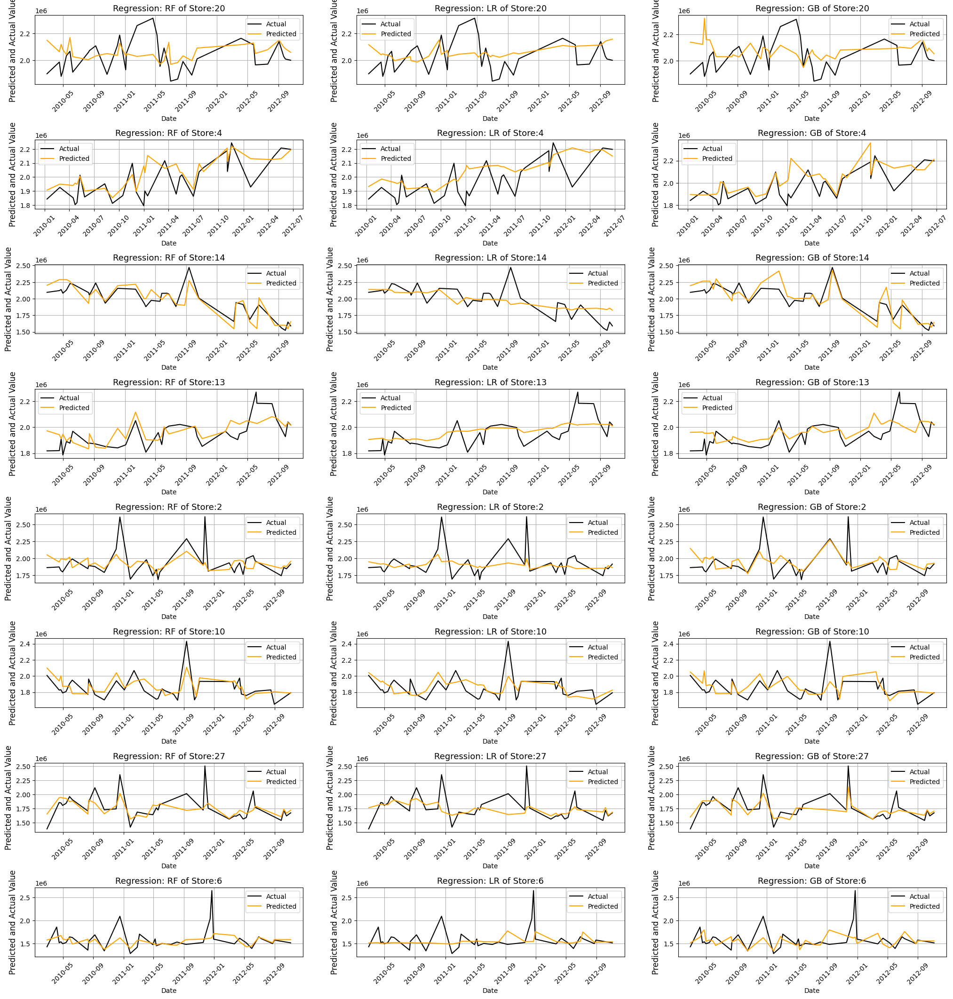

In [93]:
# Function 5 used

models_projection(info_df1['test_date'], info_df1['test_Actual'], info_df1['test_Predict'], info_df1)

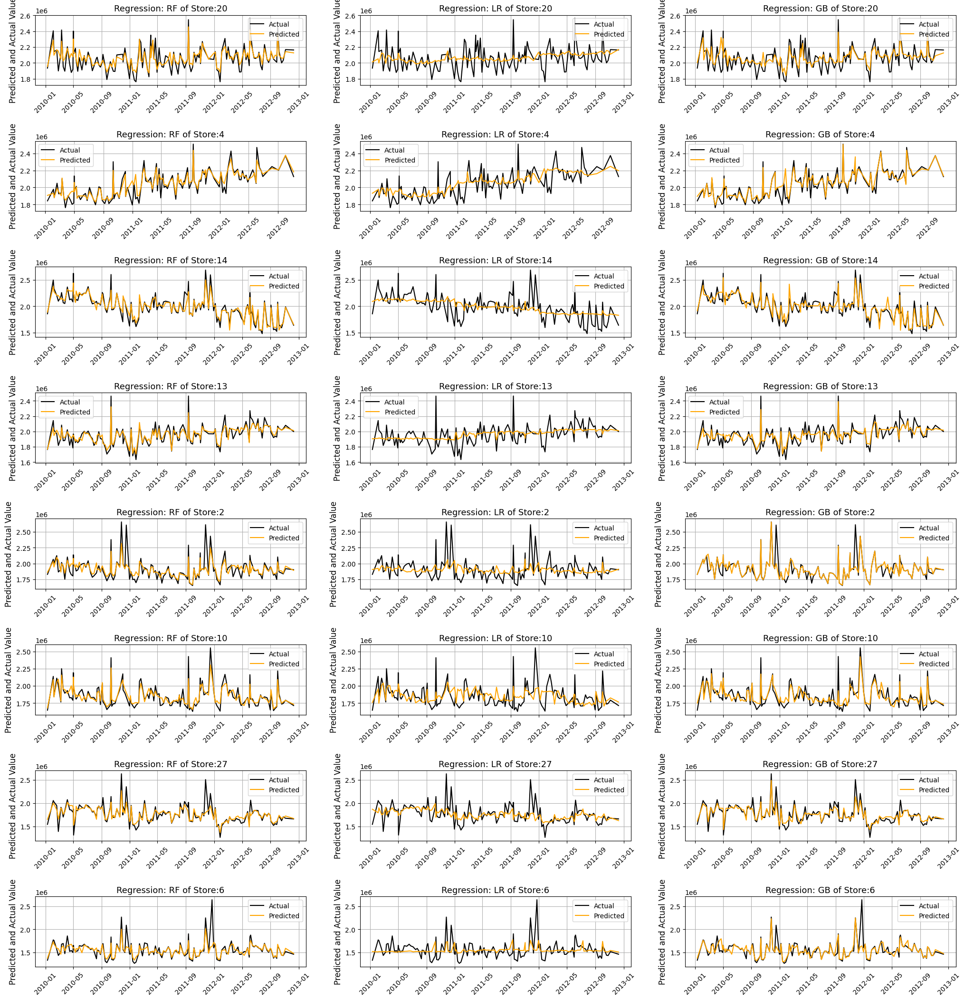

In [94]:
# Function 5 used

models_projection(info_df1['total_date'], info_df1['total_Actual'], info_df1['total_Predict'], info_df1)

### Plotting the Best Fit line for each models of each store

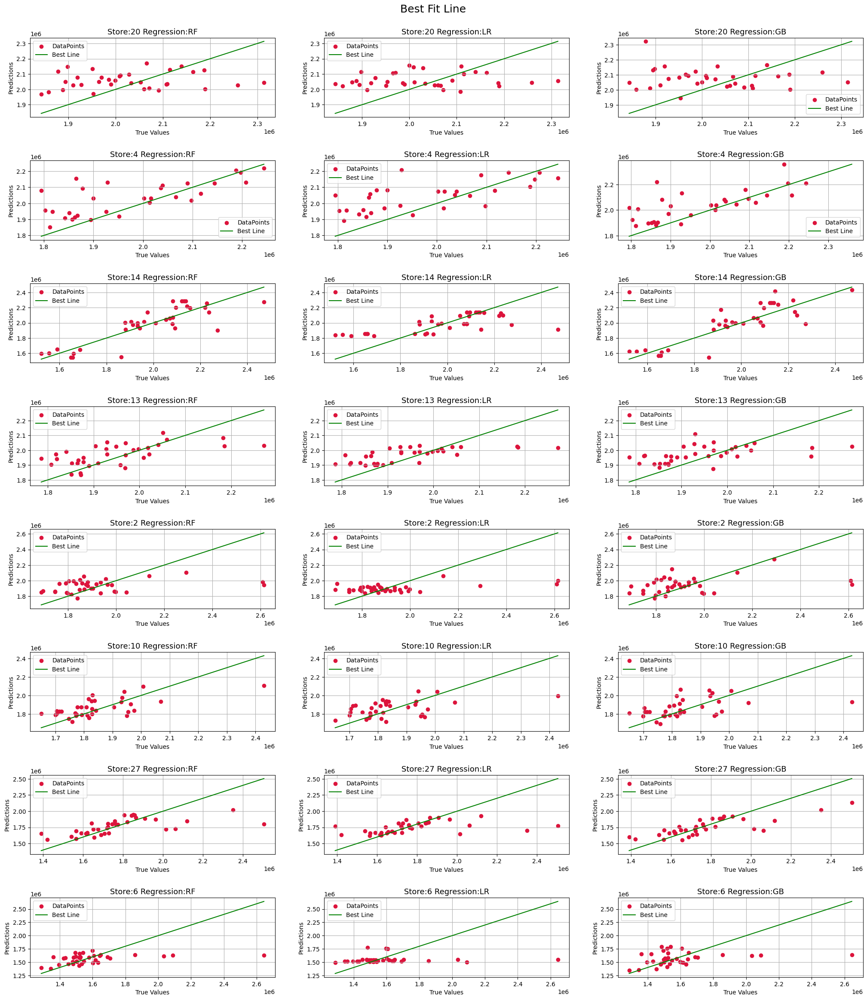

In [95]:
# Function 4 used

plotiing_best_line(info_df1)

### Calculating various Errors of Predicted Stores of various used models

In [89]:
# Function 1 used

err_reg_cal_df = pd.DataFrame(columns=['Store','Model','Max Error %','Min Error %','Mean Error %','Median Error %', 'Err_df'])
for i, store_no, model_name in zip(info_df1.index.tolist(), info_df1['Store'], info_df1['model']):
  max_err, min_err, mean_err, med_err,err = reg_err_cal(info_df1['test_Actual'][i].flatten(), info_df1['test_Predict'][i].flatten())
  err_reg_cal_df = err_reg_cal_df.append({'Store':store_no,'Model':model_name, 'Max Error %': max_err,'Min Error %':min_err,'Mean Error %':mean_err,'Median Error %':med_err,'Err_df':err}, ignore_index = True)


In [90]:
err_reg_cal_df

,Store,Model,Max Error %,Min Error %,Mean Error %,Median Error %,Err_df
0,20,RF,13.19,-11.71,1.96,3.18,index Actual Predict Err%...
1,20,LR,11.46,-11.19,2.10,2.47,index Actual Predict Err%...
2,20,GB,23.61,-11.39,2.94,2.62,index Actual Predict Err%...
3,4,RF,15.82,-3.81,3.06,1.95,index Actual Predict Err%...
4,4,LR,14.50,-5.41,3.60,3.35,index Actual Predict Err%...
5,4,GB,19.02,-4.08,3.39,2.05,index Actual Predict Err%...
6,14,RF,9.87,-16.82,0.25,1.50,index Actual Predict Err%...
7,14,LR,20.63,-22.61,1.24,0.40,index Actual Predict Err%...
8,14,GB,13.59,-17.06,0.98,1.67,index Actual Predict Err%...
9,13,RF,8.95,-10.58,1.33,0.87,index Actual Predict Err%...


## Calculating various Metrics of Predicted Stores of various used models

In [91]:
# Function 2 used

metrics_cal_df = pd.DataFrame(columns = ['Store','Model','r2_score','adj_r2','rmse_on_test', 'rmse_on_train','mape_on_test', 'mape_on_train'])
for i, store_no, model_name in zip(info_df1.index.tolist(), info_df1['Store'], info_df1['model']):
  r2, adj_r2, rmse_train, rmse_test,  mape_train, mape_test  = metrics_cal(info_df1['test_Actual'][i].flatten(), info_df1['test_Predict'][i].flatten(), info_df1['train_Actual'][i].flatten(), info_df1['train_Predict'][i].flatten())
  metrics_cal_df = metrics_cal_df.append({'Store': store_no,'Model': model_name,'r2_score':r2,'adj_r2':adj_r2,'rmse_on_test':rmse_test,'rmse_on_train':rmse_train,'mape_on_test':mape_test,'mape_on_train':mape_train}, ignore_index = True)


In [92]:
metrics_cal_df

,Store,Model,r2_score,adj_r2,rmse_on_test,rmse_on_train,mape_on_test,mape_on_train
0,20,RF,-0.17572,-0.22059,124072.18,60270.70,0.0509,0.0219
1,20,LR,-0.20987,-0.25605,125861.15,155365.74,0.0534,0.0577
2,20,GB,-0.68843,-0.75287,148683.49,82693.78,0.0595,0.0318
3,4,RF,0.33360,0.30463,109599.36,42034.99,0.0408,0.0147
4,4,LR,0.21087,0.17656,119265.74,111178.87,0.0506,0.0384
5,4,GB,0.25816,0.22591,115637.41,29988.15,0.0427,0.0110
6,14,RF,0.66831,0.65593,126956.79,69877.84,0.0483,0.0234
7,14,LR,0.41740,0.39566,168258.58,216623.88,0.0644,0.0828
8,14,GB,0.66372,0.65117,127832.59,76155.42,0.0506,0.0308
9,13,RF,0.32806,0.30261,89761.86,45466.72,0.0360,0.0164


## Forecasting Weekly sales of all Stores or Selceted Stores

In [26]:
# Stores in which Forecasting is to be done
store_list = [20,4,14,13,2,10,27,6]

## Arima Model Without Detrending Weekly Sales

## Perform Adfuller Test

In [99]:
# Function 20 used

check_stationary(df_rem,store_list )

Reject Null Hypothesis :Weekly Sales data of Store 20 is stationary
Accept Null Hypothesis :Weekly Sales data of Store 4 is not stationary
Accept Null Hypothesis :Weekly Sales data of Store 14 is not stationary
Reject Null Hypothesis :Weekly Sales data of Store 13 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 2 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 10 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 27 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 6 is stationary


## Description



*   From above adfuller Test we can see that some stores have non stationary data
*   And Performing Seasonal Decompose on the stores data we can also see thae stores seasonl and trend if their is any hustle in the trends and seasonal.



In [101]:
# Function 21 used

forecast_df1 = pd.DataFrame(columns = ['Store','Forecasted_Date','Forecasted_Weekly_Sales','Arima_Predict','Arima_Date','Test_value',
                                       'Test_Date','Full_Arima_Predict','Full_Arima_Predict_dates','Actual_Date','Actual_value','Order (p,d,r)'])

for i in store_list:
  fore_store = get_store_df(df_rem, i)
  aggregated_sales = fore_store['Weekly_Sales']
  sarimax_model = auto_arima(aggregated_sales, seasonal=True, m=52, trace=True, error_action='ignore', suppress_warnings=True)
  order = sarimax_model.order
  p,d,r = order
  if p == 0 & r == 0:
        p,q,r = order_forecast(aggregated_sales)
  train_index = len(fore_store)//5
  train = fore_store.iloc[:-train_index]['Weekly_Sales']
  test = fore_store.iloc[-train_index:]['Weekly_Sales']
  # Arima Model Predict
  arima_model = ARIMA(train, order = (p,d,r))
  arima_model_ar = arima_model.fit()
  ar_predict = arima_model_ar.predict(start = len(train), end = (len(train) + len(test))-1, dynamic = True)
  # Arima Model Forecast
  arima_model_for = ARIMA(aggregated_sales, order = (p,d,r))
  arima_model_for_ar = arima_model_for.fit()
  full_ar_predict = arima_model_for_ar.predict(start = 0, end = len(aggregated_sales)-1 )
  forecast = arima_model_for_ar.get_forecast(steps = 12)
  ar_forecast = forecast.predicted_mean
  forecast_index = pd.date_range(start=test.index[-1], periods= 12, freq = 'W', closed='right')
  forecast_df1 = forecast_df1.append({'Store':i, 'Forecasted_Date':forecast_index, 'Forecasted_Weekly_Sales': ar_forecast.values,'Arima_Predict':ar_predict.values,'Arima_Date':test.index,
                                      'Test_value': test.values,'Test_Date':test.index,'Full_Arima_Predict_dates':fore_store.index,'Full_Arima_Predict':full_ar_predict, 'Actual_Date':fore_store.index, 'Actual_value': fore_store['Weekly_Sales'].values,
                                      'Order (p,d,r)': (p,d,r) }, ignore_index = True)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[52] intercept   : AIC=3637.562, Time=13.30 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=3635.902, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=3638.631, Time=4.47 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=3638.484, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=4342.956, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[52] intercept   : AIC=3637.902, Time=1.00 sec
 ARIMA(0,0,0)(0,0,1)[52] intercept   : AIC=3637.849, Time=1.11 sec
 ARIMA(0,0,0)(1,0,1)[52] intercept   : AIC=3639.849, Time=1.92 sec
 ARIMA(1,0,0)(0,0,0)[52] intercept   : AIC=3636.635, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[52] intercept   : AIC=3636.485, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[52] intercept   : AIC=3638.385, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[52] intercept
Total fit time: 23.378 seconds
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[52] intercept   : AIC=inf, Time=12.44 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept

In [102]:
forecast_df1

,Store,Forecasted_Date,Forecasted_Weekly_Sales,Arima_Predict,Arima_Date,Test_value,Test_Date,Full_Arima_Predict,Full_Arima_Predict_dates,Actual_Date,Actual_value,"Order (p,d,r)"
0,20,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1999001.535333271, 2034831.5482962304, 212314...","[2066319.1836077156, 2044391.658879929, 202279...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[2246411.89, 2039222.26, 2114989.0, 1964701.94...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 2.058998e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1933719.21, 2405395.22, 2143676.77, 2161549.7...","(2, 0, 2)"
1,4,"DatetimeIndex(['2012-11-11', '2012-11-18', '20...","[2174845.0027174475, 2165831.5660897978, 21675...","[1981787.7022863664, 1975018.641303653, 197616...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...","[2005097.76, 1928720.51, 2206319.9, 2427640.17...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...",Date 2010-01-10 0.000000e+00 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1842821.02, 1979247.12, 1881337.21, 2049860.2...","(1, 1, 0)"
2,14,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1555234.3021300726, 1630643.8160051552, 18368...","[1837690.4715400399, 1855021.4546409745, 18752...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[1687592.16, 1932233.17, 2030869.61, 1859144.9...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 0.000000e+00 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1855703.66, 2495630.51, 2334788.42, 2204556.7...","(2, 1, 3)"
3,13,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[2009787.7884424655, 2015521.1460930614, 20185...","[1972308.4532910401, 1973532.106052234, 197421...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[2041918.74, 2131900.55, 2043349.41, 1865752.7...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 0.000000e+00 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1765584.48, 2142482.14, 2018314.71, 1970274.6...","(1, 1, 1)"
4,2,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1914938.0301003885, 1929138.745803175, 187158...","[1911296.420081512, 1896414.3866968304, 191747...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...","[1764133.09, 1998321.04, 2000940.67, 1912791.0...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...",Date 2010-01-10 1.905830e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1827440.43, 2066187.72, 2003940.64, 2124451.5...","(2, 0, 2)"
5,10,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1838117.5966362557, 1851204.506364747, 185258...","[1850240.0718189313, 1864281.310980101, 186571...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[1758971.38, 1795152.73, 1830939.1, 1683401.78...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 1.852745e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1645892.97, 2138651.97, 1845893.87, 2113432.5...","(1, 0, 0)"
6,27,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1702929.729412451, 1716524.0238276992, 172568...","[1694121.8086218839, 1712476.9117725913, 17252...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...","[1565498.84, 1591816.88, 1707158.82, 1818906.7...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...",Date 2010-01-10 0.000000e+00 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1543532.83, 2053952.97, 2024554.1, 1945070.33...","(2, 1, 1)"
7,6,"DatetimeIndex(['2012-12-16', '2012-12-23', '20...","[1540269.0127569574, 1553814.0842013247, 15560...","[1541933.384

### Plotting all Predicted and forcasted values with all Weekly Sales of Predicted Stores

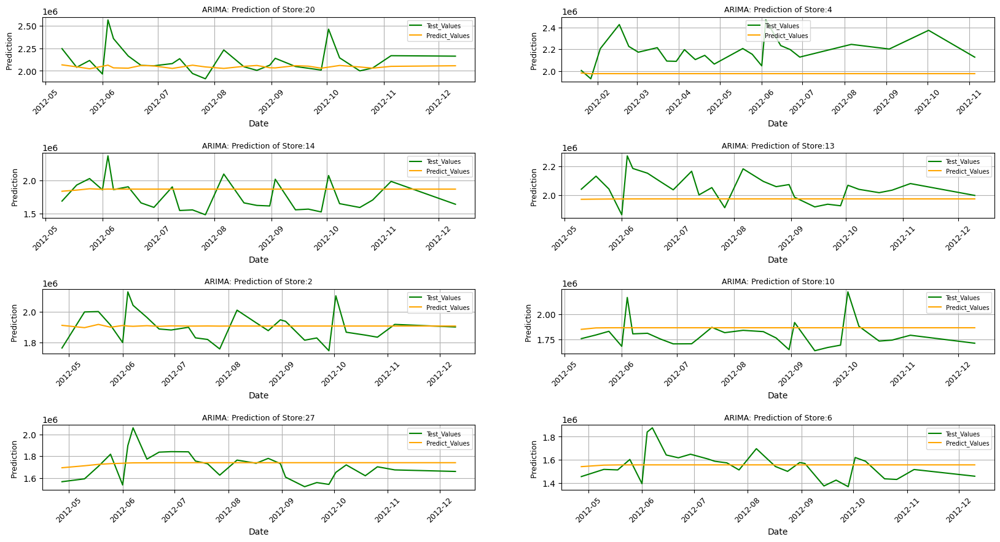

In [105]:
# Function 19 used

forecast_Predict_projection(forecast_df1,'AR_Predict')

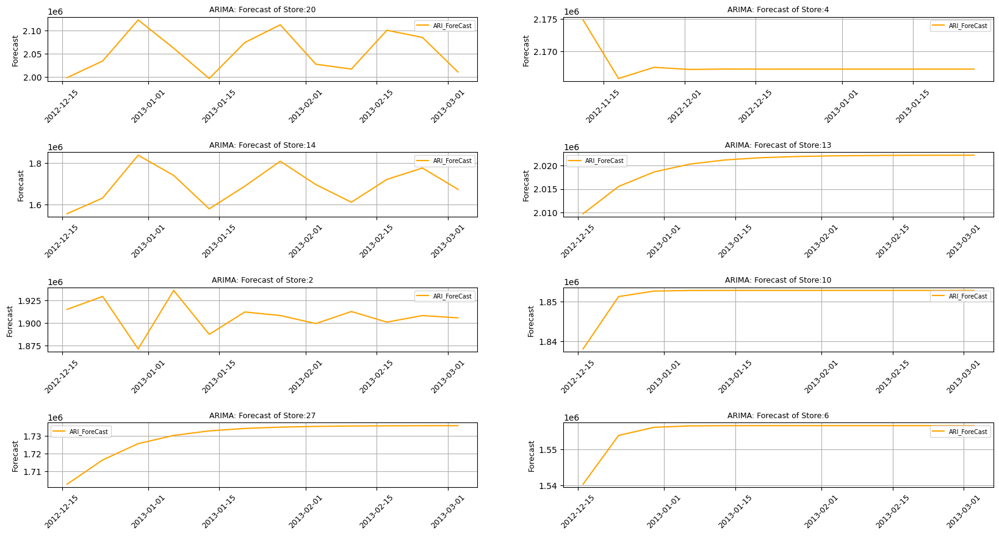

In [106]:
# Function 19 used

forecast_Predict_projection(forecast_df1,'AR_Forecast')

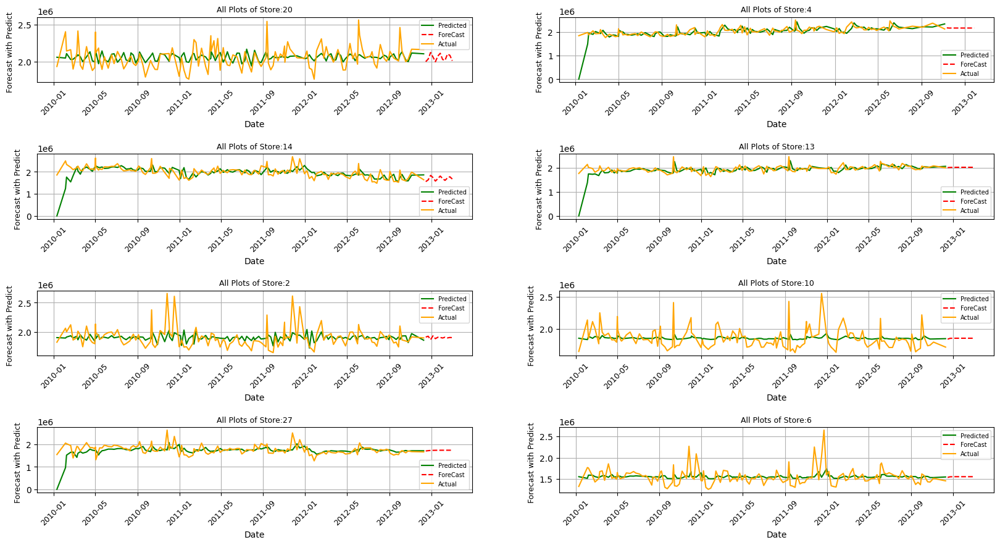

In [107]:
# Function 19 used

forecast_Predict_projection(forecast_df1, )

### Calculating various Errors of Predicted Stores of model technique Forecasting 

In [103]:
# Function 1 used

err_fore_cal_df = pd.DataFrame(columns=['Store','Max Error %','Min Error %','Mean Error %','Median Error %','Err_df'])
for i, store_no in zip(forecast_df1.index.tolist(), forecast_df1['Store']):
  max_err, min_err, mean_err, med_err,err = reg_err_cal(forecast_df1['Test_value'][i], forecast_df1['Full_Arima_Predict'][i])
  err_fore_cal_df = err_fore_cal_df.append({'Store':store_no, 'Max Error %': max_err,'Min Error %':min_err,'Mean Error %':mean_err,'Median Error %':med_err,'Err_df':err}, ignore_index = True)


In [104]:
err_fore_cal_df

,Store,Max Error %,Min Error %,Mean Error %,Median Error %,Err_df
0,20,4.56,-20.79,-2.53,-1.08,index Actual Predict Err%...
1,4,-1.00,-100.00,-16.32,-12.63,index Actual Predict Err...
2,14,49.34,-100.00,15.29,30.08,index Actual Predict Err...
3,13,-0.12,-100.00,-13.92,-8.34,index Actual Predict Err...
4,2,11.46,-9.38,0.60,0.97,index Actual Predict Err%...
5,10,12.93,-16.56,3.78,5.33,index Actual Predict Err%...
6,27,17.54,-100.00,-5.70,-1.07,index Actual Predict Err...
7,6,15.16,-17.45,1.01,-0.03,index Actual Predict Err%...


## Description

From the forecast we can see that most of the forcast are having without proper fluctuation and some of the stores are not showing proper forecasting

Conclusion:-

So After detreanding once the data forecast we will be applied as most of the forecast is showing some downward Trend

## After Detrending Weekly Sales

### Seasonl Decompose

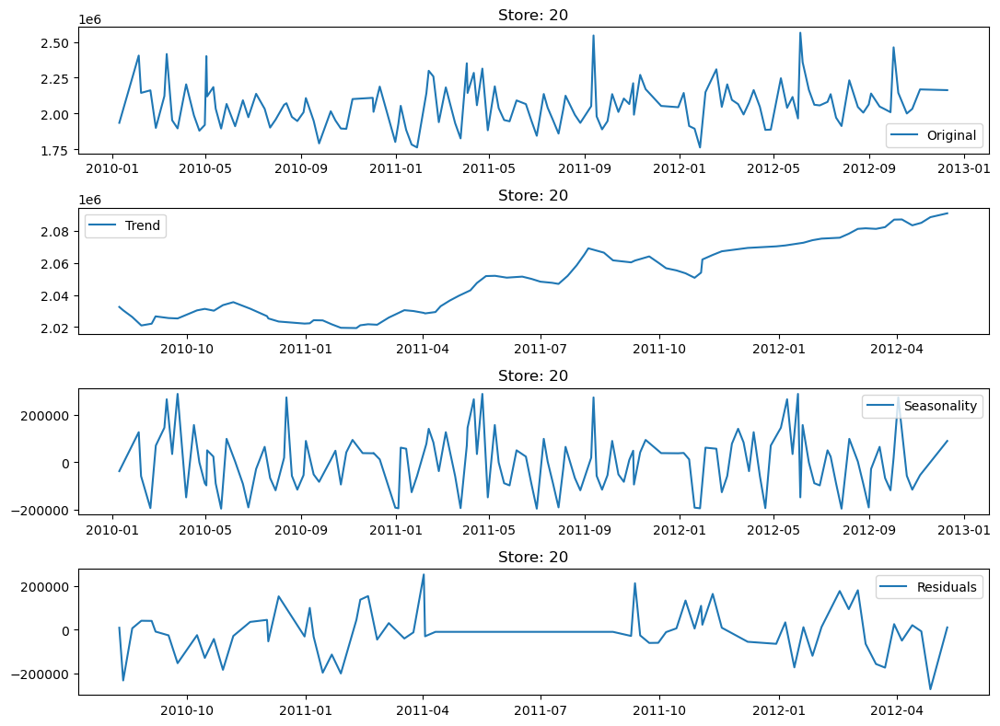

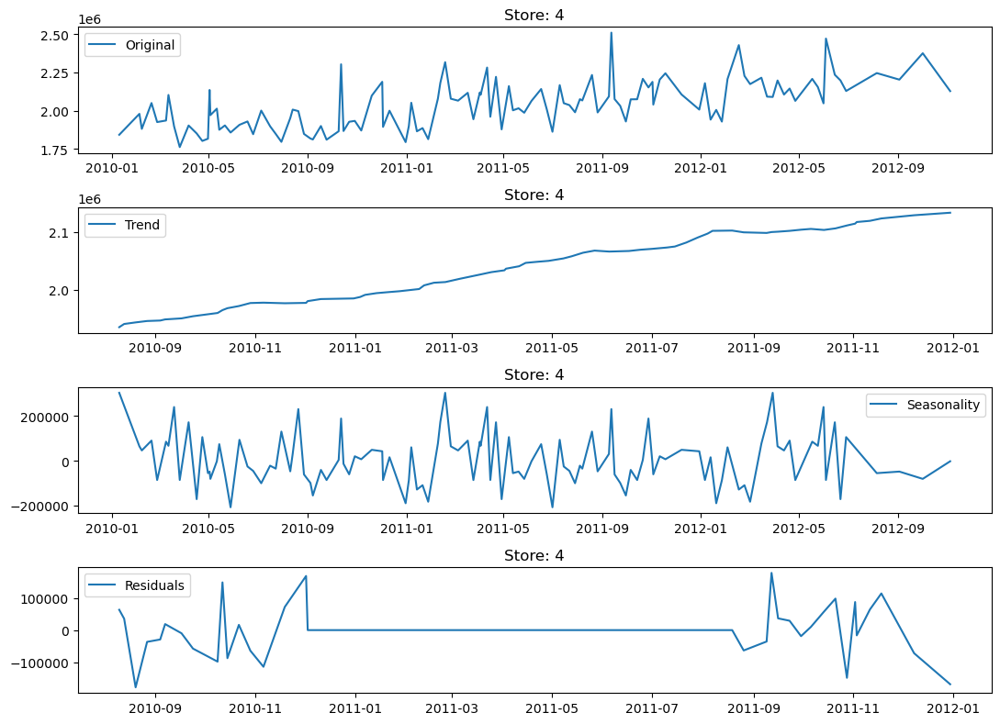

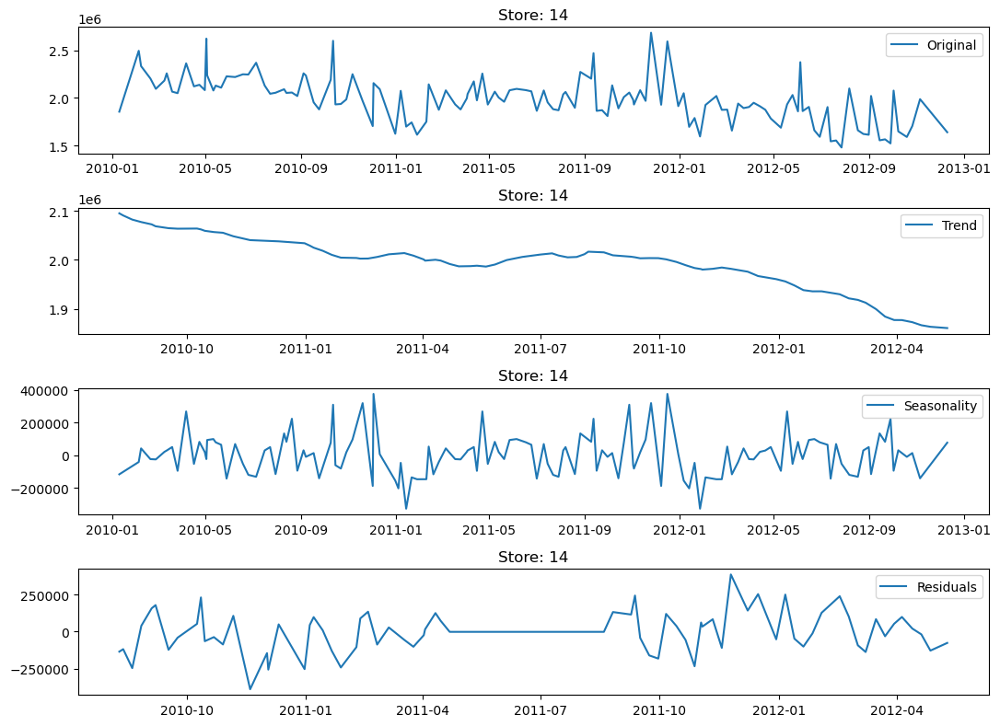

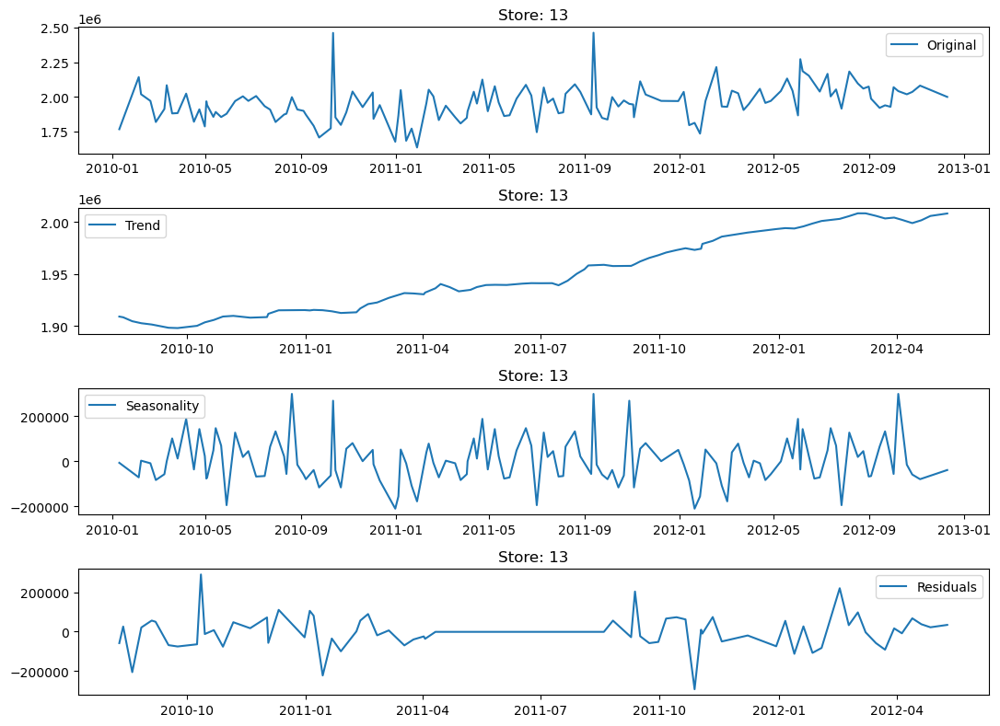

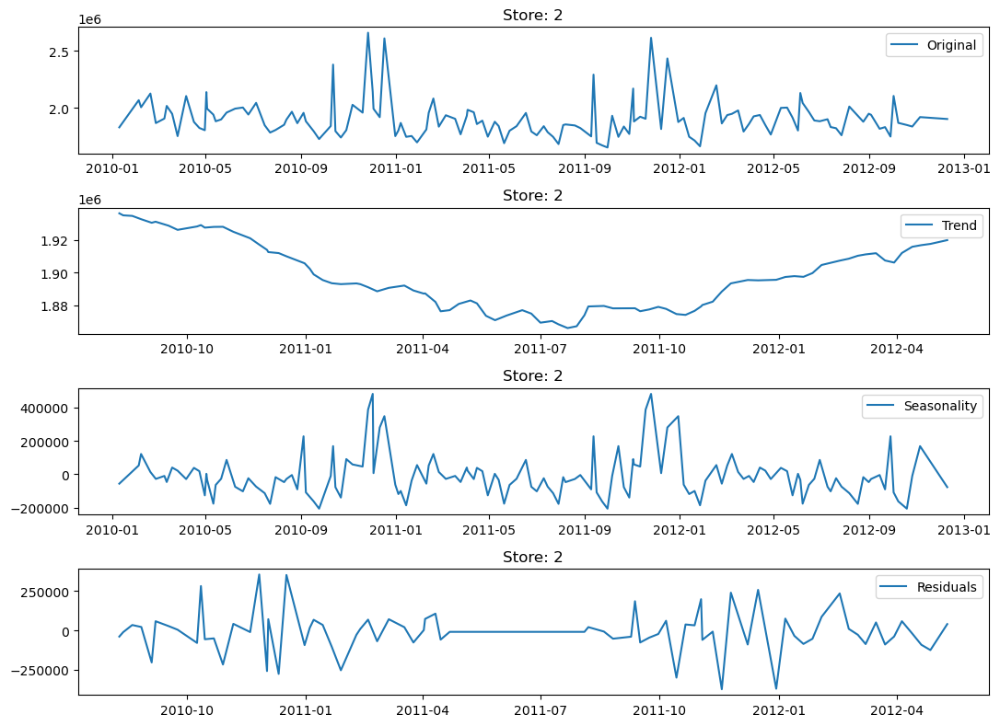

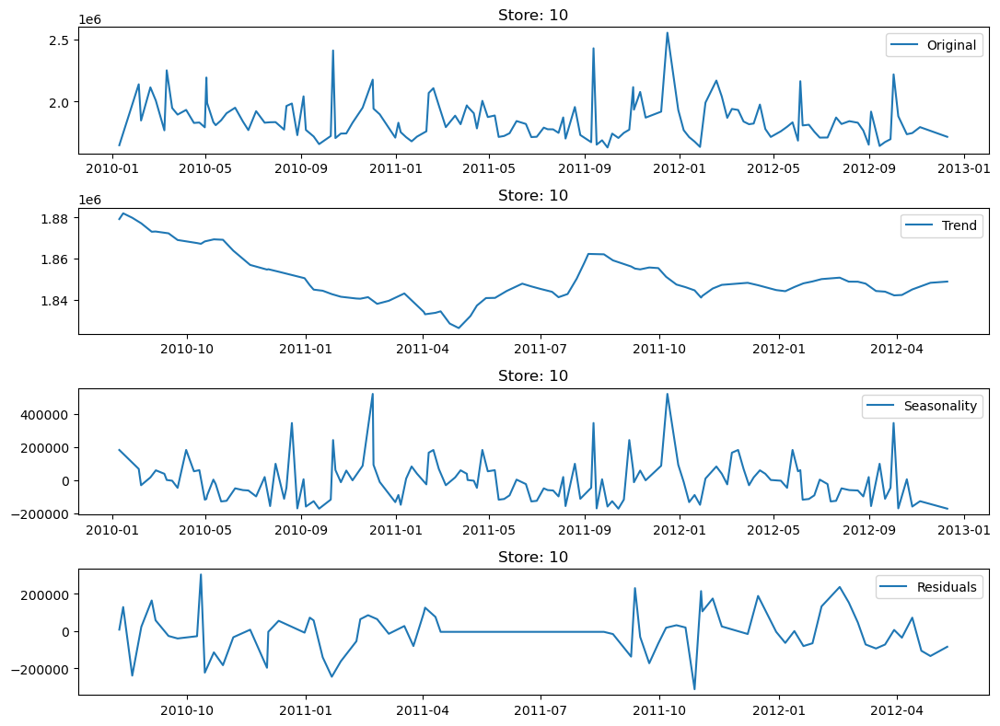

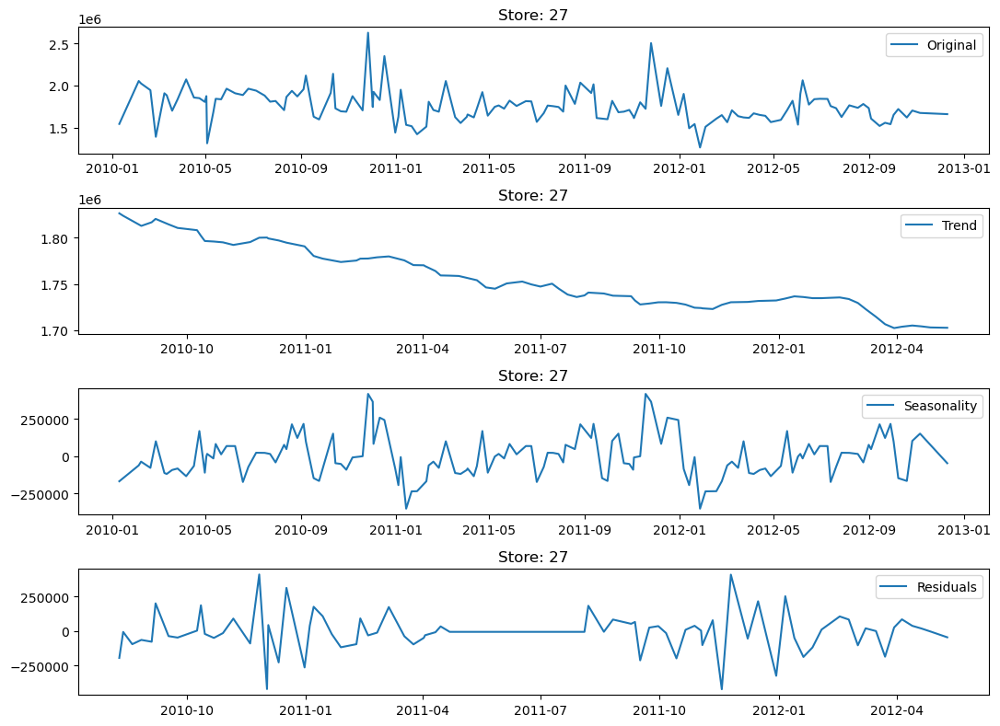

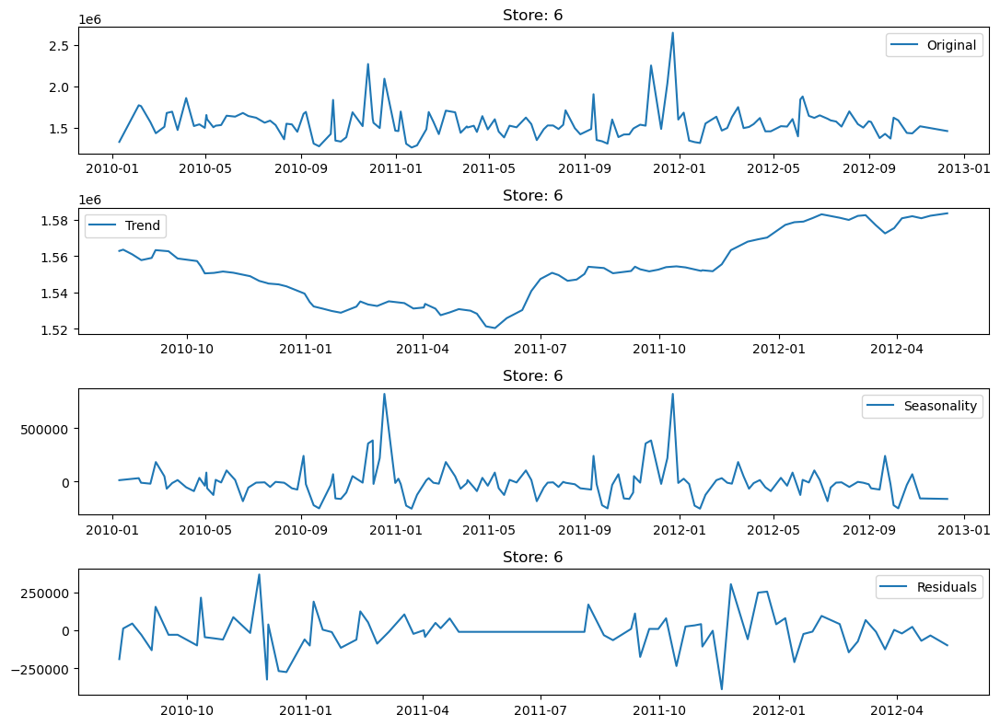

In [28]:
# Function 22 used

store_seasonal(df_rem,store_list)

In [110]:
# Function 23 used

check_stationary_detrend(df_rem,store_list )

Reject Null Hypothesis :Weekly Sales data of Store 20 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 4 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 14 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 13 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 2 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 10 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 27 is stationary
Reject Null Hypothesis :Weekly Sales data of Store 6 is stationary


# Detrending



*   The trend component shows the general direction of the sales data over time,
smoothing out the noise and seasonal effects. The seasonal component captures the regular pattern that repeats annually, and the residuals represent the irregularities that are not explained by the trend or seasonality

*   We can use additive models for seasonal decompose as their is no significant or sudden increase in seasonlaity
*   So we will ne focusing on residual wehere both seasonl and trend has been removed








In [111]:
# Function 21 used

detrend_forecast = pd.DataFrame(columns = ['Store','Forecasted_Date','Forecasted_Weekly_Sales','Arima_Predict','Arima_Date','Test_value',
                                       'Test_Date','Full_Arima_Predict','Full_Arima_Predict_dates','Actual_Date','Actual_value','Order (p,d,r)'])
for i in store_list:
  fore_store = get_store_df(df_rem, i)
  fore_store = fore_store[['Weekly_Sales']]
  fore_store.index.sort_values()

  moving_average = fore_store['Weekly_Sales'].rolling(window = 52, min_periods=1, center=True).mean()
  rolling_mean_detrended = fore_store['Weekly_Sales'] - moving_average

  rolling_mean_detrended_not_null = rolling_mean_detrended.dropna()
  train_index = len(rolling_mean_detrended_not_null)//5
  train = rolling_mean_detrended_not_null.iloc[:-train_index]
  test = rolling_mean_detrended_not_null.iloc[-train_index:]

  model = auto_arima(rolling_mean_detrended.dropna(), trace=False, error_action='ignore', suppress_warnings=True)
  p,d,r = model.order
  if p == 0 & r == 0:
    p,q,r = order_forecast(rolling_mean_detrended.dropna())

  # model train predict
  arima_model = ARIMA(train, order = (p,d,r))
  arima_fit = arima_model.fit()
  preds = arima_fit.predict(start = len(train), end = len(rolling_mean_detrended)-1)
  arima_pred = preds.values + moving_average.loc[test.index]

  #full model fit
  full_arima_model = ARIMA(rolling_mean_detrended.dropna(), order = (p,d,r))
  full_arima_fit_model = full_arima_model.fit()

  # Full Predicted
  full_arima_preds = full_arima_fit_model.predict(start = 0, end = len(rolling_mean_detrended)-1)
  reconstructed_sales = full_arima_preds + moving_average.loc[rolling_mean_detrended.index]


  # forecast
  arima_forecast = full_arima_fit_model.get_forecast(steps = 12)
  final_forecast = arima_forecast.predicted_mean + moving_average[-1]
  final_forecast_dates = pd.date_range(start = fore_store.index[-1], periods = 13, freq = 'W' )[1:]




  detrend_forecast = detrend_forecast.append({'Store':i, 'Forecasted_Date':final_forecast_dates, 'Forecasted_Weekly_Sales': final_forecast.values,'Arima_Predict':arima_pred,'Arima_Date':test.index,'Test_value':fore_store.iloc[-train_index:]['Weekly_Sales'].values,
                                              'Test_Date':fore_store.iloc[-train_index:]['Weekly_Sales'].index,'Full_Arima_Predict':reconstructed_sales,'Full_Arima_Predict_dates':reconstructed_sales.index,'Actual_value': fore_store['Weekly_Sales'].values, 'Actual_Date': fore_store.index,'Order (p,d,r)': (p,d,r) }, ignore_index = True)


In [112]:
detrend_forecast

,Store,Forecasted_Date,Forecasted_Weekly_Sales,Arima_Predict,Arima_Date,Test_value,Test_Date,Full_Arima_Predict,Full_Arima_Predict_dates,Actual_Date,Actual_value,"Order (p,d,r)"
0,20,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[2065860.3367275435, 2110920.919663506, 219601...",Date 2012-05-10 2.115341e+06 2012-05-18 ...,"DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[2246411.89, 2039222.26, 2114989.0, 1964701.94...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 2.064391e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1933719.21, 2405395.22, 2143676.77, 2161549.7...","(3, 0, 3)"
1,4,"DatetimeIndex(['2012-11-18', '2012-11-25', '20...","[2148487.7901268546, 2137120.6940180147, 21420...",Date 2012-01-20 2.119667e+06 2012-01-27 ...,"DatetimeIndex(['2012-01-20', '2012-01-27', '20...","[2005097.76, 1928720.51, 2206319.9, 2427640.17...","DatetimeIndex(['2012-01-20', '2012-01-27', '20...",Date 2010-01-10 1.916236e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1842821.02, 1979247.12, 1881337.21, 2049860.2...","(1, 0, 3)"
2,14,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[1660971.997227901, 1704180.4801347603, 193988...",Date 2012-05-10 1.832590e+06 2012-05-18 ...,"DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[1687592.16, 1932233.17, 2030869.61, 1859144.9...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 2.187959e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1855703.66, 2495630.51, 2334788.42, 2204556.7...","(3, 0, 3)"
3,13,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[2038609.7213758137, 2051964.933003665, 206770...",Date 2012-05-10 2.001532e+06 2012-05-18 ...,"DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[2041918.74, 2131900.55, 2043349.41, 1865752.7...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 1.923841e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1765584.48, 2142482.14, 2018314.71, 1970274.6...","(3, 0, 3)"
4,2,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[1915481.2337926324, 1929211.7926181394, 18729...",Date 2012-04-27 1.923595e+06 2012-05-10 ...,"DatetimeIndex(['2012-04-27', '2012-05-10', '20...","[1764133.09, 1998321.04, 2000940.67, 1912791.0...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...",Date 2010-01-10 1.935325e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1827440.43, 2066187.72, 2003940.64, 2124451.5...","(2, 0, 2)"
5,10,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[1794776.376758347, 1800217.8740359077, 180463...",Date 2012-05-10 1.841191e+06 2012-05-18 ...,"DatetimeIndex(['2012-05-10', '2012-05-18', '20...","[1758971.38, 1795152.73, 1830939.1, 1683401.78...","DatetimeIndex(['2012-05-10', '2012-05-18', '20...",Date 2010-01-10 1.905214e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1645892.97, 2138651.97, 1845893.87, 2113432.5...","(0, 0, 3)"
6,27,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[1697046.5800940369, 1710264.3885749113, 17104...",Date 2012-04-27 1.669515e+06 2012-05-10 ...,"DatetimeIndex(['2012-04-27', '2012-05-10', '20...","[1565498.84, 1591816.88, 1707158.82, 1818906.7...","DatetimeIndex(['2012-04-27', '2012-05-10', '20...",Date 2010-01-10 1.828749e+06 2010-02-04 ...,"DatetimeIndex(['2010-01-10', '2010-02-04', '20...","DatetimeIndex(['2010-01-10', '2010-02-04', '20...","[1543532.83, 2053952.97, 2024554.1, 1945070.33...","(2, 0, 1)"
7,6,"DatetimeIndex(['2012-12-23', '2012-12-30', '20...","[1504324.446914587, 1551950.1019316523, 158602...",Date 2012-04-27 1.594399e+06 2012-05-10 ...,"DatetimeIndex(['2012-04-

### Plotting all Predicted and forcasted values of all detrended Weekly Sales of Predicted Stores

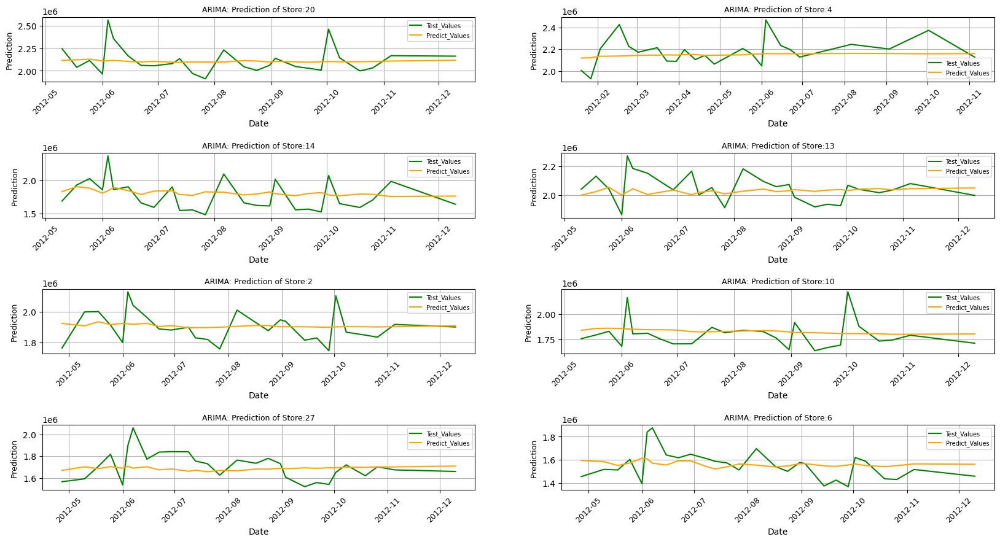

In [113]:
# Function 19 used

forecast_Predict_projection(detrend_forecast,'AR_Predict')

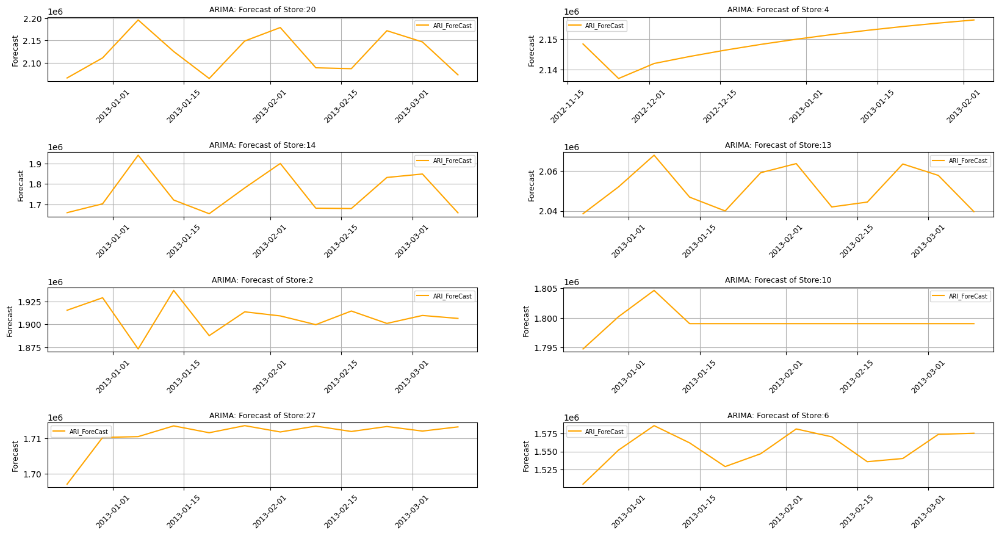

In [114]:
# Function 19 used

forecast_Predict_projection(detrend_forecast,'AR_Forecast')

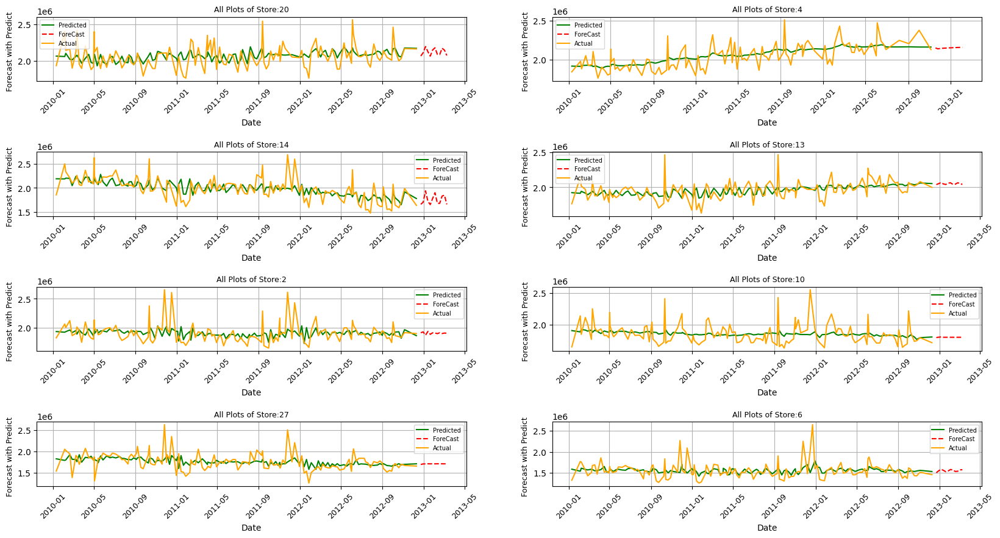

In [115]:
# Function 19 used

forecast_Predict_projection(detrend_forecast,)

### Error calculation of Detrended Weekly Sales

ARIMA_Detrended_Error

In [116]:
err_detrend_fore_cal_df = pd.DataFrame(columns=['Store','Max Error %','Min Error %','Mean Error %','Median Error %','Err_df'])
for i, store_no in zip(detrend_forecast.index.tolist(), detrend_forecast['Store']):
  max_err, min_err, mean_err, med_err,err = reg_err_cal(detrend_forecast['Actual_value'][i], detrend_forecast['Arima_Predict'][i])
  err_detrend_fore_cal_df = err_detrend_fore_cal_df.append({'Store':store_no, 'Max Error %': max_err,'Min Error %':min_err,'Mean Error %':mean_err,'Median Error %':med_err,'Err_df':err}, ignore_index = True)


In [117]:
err_detrend_fore_cal_df

,Store,Max Error %,Min Error %,Mean Error %,Median Error %,Err_df
0,20,11.75,-12.91,2.67,3.21,index Actual Predict Err%...
1,4,21.80,0.64,12.14,13.19,index Actual Predict Err%...
2,14,-1.25,-30.55,-16.75,-15.75,index Actual Predict Err%...
3,13,13.36,-5.46,5.86,6.79,index Actual Predict Err%...
4,2,8.77,-11.12,-0.90,-0.43,index Actual Predict Err%...
5,10,11.87,-17.96,-3.26,-1.65,index Actual Predict Err%...
6,27,26.78,-18.81,-6.69,-9.67,index Actual Predict Err%...
7,6,20.02,-14.31,-0.53,-0.89,index Actual Predict Err%...


### Comparing Two Gradient Bossting Model and Forecast Model

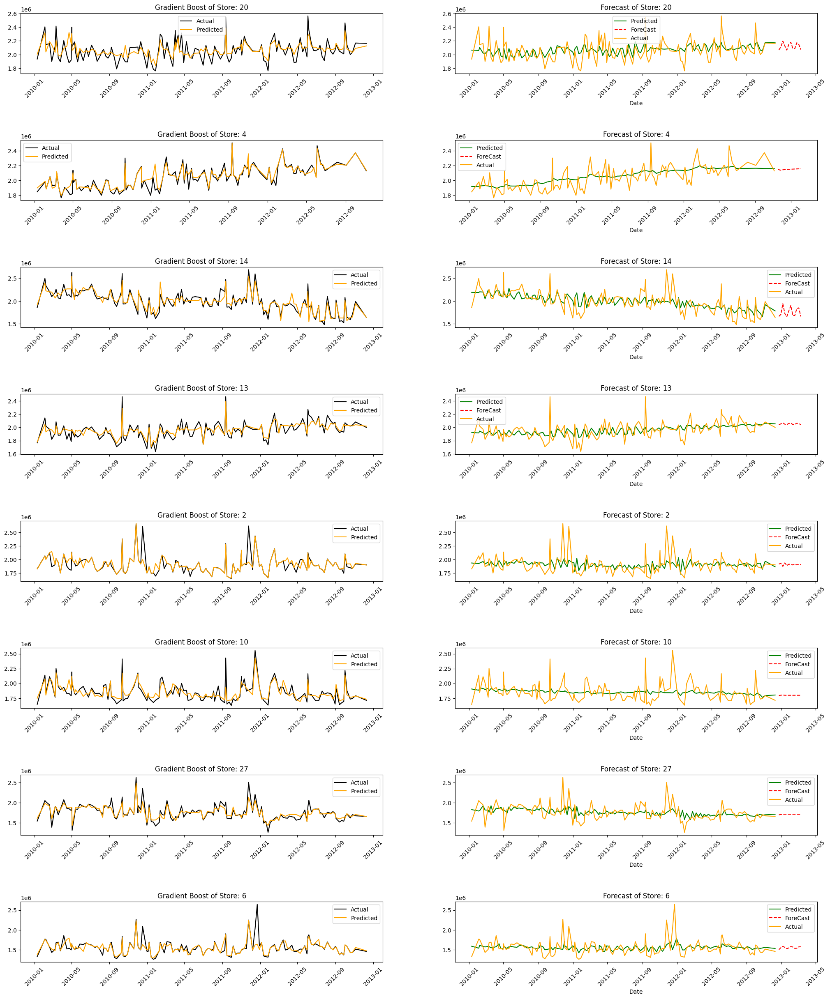

In [119]:
# Function 24 used

compare_plot(info_df1,detrend_forecast )